# Project: Train a Quadcopter How to Fly

Design an agent to fly a quadcopter, and then train it using a reinforcement learning algorithm of your choice! 

Try to apply the techniques you have learnt, but also feel free to come up with innovative ideas and test them.

## Instructions

Take a look at the files in the directory to better understand the structure of the project. 

- `task.py`: Define your task (environment) in this file.
- `agents/`: Folder containing reinforcement learning agents.
    - `policy_search.py`: A sample agent has been provided here.
    - `agent.py`: Develop your agent here.
- `physics_sim.py`: This file contains the simulator for the quadcopter.  **DO NOT MODIFY THIS FILE**.

For this project, you will define your own task in `task.py`.  Although we have provided a example task to get you started, you are encouraged to change it.  Later in this notebook, you will learn more about how to amend this file.

You will also design a reinforcement learning agent in `agent.py` to complete your chosen task.  

You are welcome to create any additional files to help you to organize your code.  For instance, you may find it useful to define a `model.py` file defining any needed neural network architectures.

## Controlling the Quadcopter

We provide a sample agent in the code cell below to show you how to use the sim to control the quadcopter.  This agent is even simpler than the sample agent that you'll examine (in `agents/policy_search.py`) later in this notebook!

The agent controls the quadcopter by setting the revolutions per second on each of its four rotors.  The provided agent in the `Basic_Agent` class below always selects a random action for each of the four rotors.  These four speeds are returned by the `act` method as a list of four floating-point numbers.  

For this project, the agent that you will implement in `agents/agent.py` will have a far more intelligent method for selecting actions!

In [1]:
import random

class Basic_Agent():
    def __init__(self, task):
        self.task = task
    
    def act(self):
        new_thrust = random.gauss(450., 25.)
        return [new_thrust + random.gauss(0., 1.) for x in range(4)]

Run the code cell below to have the agent select actions to control the quadcopter.  

Feel free to change the provided values of `runtime`, `init_pose`, `init_velocities`, and `init_angle_velocities` below to change the starting conditions of the quadcopter.

The `labels` list below annotates statistics that are saved while running the simulation.  All of this information is saved in a text file `data.txt` and stored in the dictionary `results`.  

In [2]:
%load_ext autoreload
%autoreload 2

import csv
import numpy as np
from task import Task

# Modify the values below to give the quadcopter a different starting position.
runtime = 5.                                     # time limit of the episode
init_pose = np.array([0., 0., 10., 0., 0., 0.])  # initial pose
init_velocities = np.array([0., 0., 0.])         # initial velocities
init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
file_output = 'data.txt'                         # file name for saved results

# Setup
task = Task(init_pose, init_velocities, init_angle_velocities, runtime)
agent = Basic_Agent(task)
done = False
labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4']
results = {x : [] for x in labels}

# Run the simulation, and save the results.
with open(file_output, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(labels)
    while True:
        rotor_speeds = agent.act()
        _, _, done = task.step(rotor_speeds)
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(rotor_speeds)
        for ii in range(len(labels)):
            results[labels[ii]].append(to_write[ii])
        writer.writerow(to_write)
        if done:
            break

Run the code cell below to visualize how the position of the quadcopter evolved during the simulation.

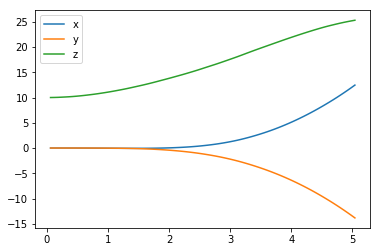

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(results['time'], results['x'], label='x')
plt.plot(results['time'], results['y'], label='y')
plt.plot(results['time'], results['z'], label='z')
plt.legend()
_ = plt.ylim()

The next code cell visualizes the velocity of the quadcopter.

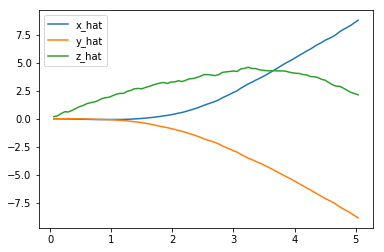

In [4]:
plt.plot(results['time'], results['x_velocity'], label='x_hat')
plt.plot(results['time'], results['y_velocity'], label='y_hat')
plt.plot(results['time'], results['z_velocity'], label='z_hat')
plt.legend()
_ = plt.ylim()

Next, you can plot the Euler angles (the rotation of the quadcopter over the $x$-, $y$-, and $z$-axes),

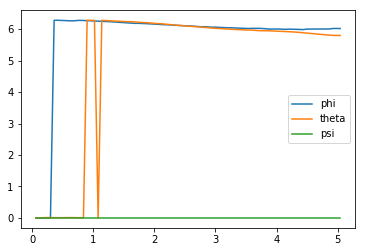

In [5]:
plt.plot(results['time'], results['phi'], label='phi')
plt.plot(results['time'], results['theta'], label='theta')
plt.plot(results['time'], results['psi'], label='psi')
plt.legend()
_ = plt.ylim()

before plotting the velocities (in radians per second) corresponding to each of the Euler angles.

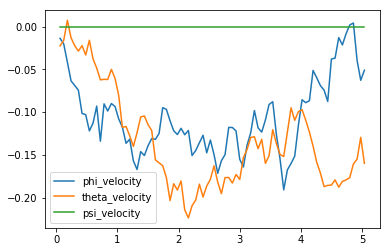

In [6]:
plt.plot(results['time'], results['phi_velocity'], label='phi_velocity')
plt.plot(results['time'], results['theta_velocity'], label='theta_velocity')
plt.plot(results['time'], results['psi_velocity'], label='psi_velocity')
plt.legend()
_ = plt.ylim()

Finally, you can use the code cell below to print the agent's choice of actions.  

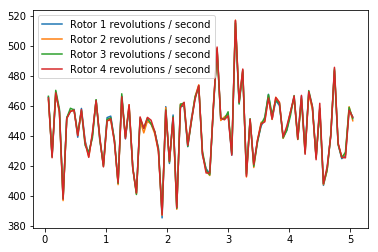

In [7]:
plt.plot(results['time'], results['rotor_speed1'], label='Rotor 1 revolutions / second')
plt.plot(results['time'], results['rotor_speed2'], label='Rotor 2 revolutions / second')
plt.plot(results['time'], results['rotor_speed3'], label='Rotor 3 revolutions / second')
plt.plot(results['time'], results['rotor_speed4'], label='Rotor 4 revolutions / second')
plt.legend()
_ = plt.ylim()

When specifying a task, you will derive the environment state from the simulator.  Run the code cell below to print the values of the following variables at the end of the simulation:
- `task.sim.pose` (the position of the quadcopter in ($x,y,z$) dimensions and the Euler angles),
- `task.sim.v` (the velocity of the quadcopter in ($x,y,z$) dimensions), and
- `task.sim.angular_v` (radians/second for each of the three Euler angles).

In [8]:
# the pose, velocity, and angular velocity of the quadcopter at the end of the episode
print(task.sim.pose)
print(task.sim.v)
print(task.sim.angular_v)

[ 12.46719506 -13.83943769  25.31152454   6.01793032   5.79694534
   0.        ]
[ 8.79803832 -8.85314006  2.13552416]
[-0.05094949 -0.15989909  0.        ]


In the sample task in `task.py`, we use the 6-dimensional pose of the quadcopter to construct the state of the environment at each timestep.  However, when amending the task for your purposes, you are welcome to expand the size of the state vector by including the velocity information.  You can use any combination of the pose, velocity, and angular velocity - feel free to tinker here, and construct the state to suit your task.

## The Task

A sample task has been provided for you in `task.py`.  Open this file in a new window now. 

The `__init__()` method is used to initialize several variables that are needed to specify the task.  
- The simulator is initialized as an instance of the `PhysicsSim` class (from `physics_sim.py`).  
- Inspired by the methodology in the original DDPG paper, we make use of action repeats.  For each timestep of the agent, we step the simulation `action_repeats` timesteps.  If you are not familiar with action repeats, please read the **Results** section in [the DDPG paper](https://arxiv.org/abs/1509.02971).
- We set the number of elements in the state vector.  For the sample task, we only work with the 6-dimensional pose information.  To set the size of the state (`state_size`), we must take action repeats into account.  
- The environment will always have a 4-dimensional action space, with one entry for each rotor (`action_size=4`). You can set the minimum (`action_low`) and maximum (`action_high`) values of each entry here.
- The sample task in this provided file is for the agent to reach a target position.  We specify that target position as a variable.

The `reset()` method resets the simulator.  The agent should call this method every time the episode ends.  You can see an example of this in the code cell below.

The `step()` method is perhaps the most important.  It accepts the agent's choice of action `rotor_speeds`, which is used to prepare the next state to pass on to the agent.  Then, the reward is computed from `get_reward()`.  The episode is considered done if the time limit has been exceeded, or the quadcopter has travelled outside of the bounds of the simulation.

In the next section, you will learn how to test the performance of an agent on this task.

## The Agent

The sample agent given in `agents/policy_search.py` uses a very simplistic linear policy to directly compute the action vector as a dot product of the state vector and a matrix of weights. Then, it randomly perturbs the parameters by adding some Gaussian noise, to produce a different policy. Based on the average reward obtained in each episode (`score`), it keeps track of the best set of parameters found so far, how the score is changing, and accordingly tweaks a scaling factor to widen or tighten the noise.

Run the code cell below to see how the agent performs on the sample task.

In [9]:
import sys
import pandas as pd
from agents.policy_search import PolicySearch_Agent
from task import Task

num_episodes = 1000
target_pos = np.array([0., 0., 10.])
task = Task(target_pos=target_pos)
agent = PolicySearch_Agent(task) 

for i_episode in range(1, num_episodes+1):
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
        agent.step(reward, done)
        state = next_state
        if done:
            print("\rEpisode = {:4d}, score = {:7.3f} (best = {:7.3f}), noise_scale = {}".format(
                i_episode, agent.score, agent.best_score, agent.noise_scale), end="")  # [debug]
            break
    sys.stdout.flush()

Episode = 1000, score =  -0.865 (best =  -0.087), noise_scale = 3.25

This agent should perform very poorly on this task.  And that's where you come in!

## Define the Task, Design the Agent, and Train Your Agent!

Amend `task.py` to specify a task of your choosing.  If you're unsure what kind of task to specify, you may like to teach your quadcopter to takeoff, hover in place, land softly, or reach a target pose.  

After specifying your task, use the sample agent in `agents/policy_search.py` as a template to define your own agent in `agents/agent.py`.  You can borrow whatever you need from the sample agent, including ideas on how you might modularize your code (using helper methods like `act()`, `learn()`, `reset_episode()`, etc.).

Note that it is **highly unlikely** that the first agent and task that you specify will learn well.  You will likely have to tweak various hyperparameters and the reward function for your task until you arrive at reasonably good behavior.

As you develop your agent, it's important to keep an eye on how it's performing. Use the code above as inspiration to build in a mechanism to log/save the total rewards obtained in each episode to file.  If the episode rewards are gradually increasing, this is an indication that your agent is learning.

## Plot the Rewards

Once you are satisfied with your performance, plot the episode rewards, either from a single run, or averaged over multiple runs. 

C:\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.



Episode =    1, Reward = -1.2772, Avg Distance = 5.09858, time =  0.9

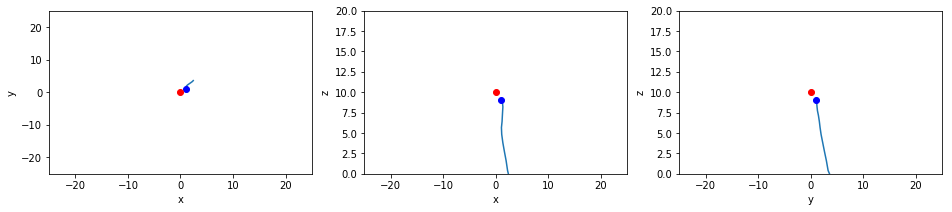

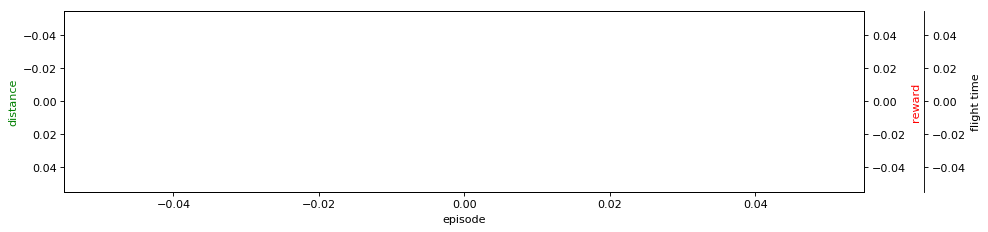

Episode =   51, Reward = 1.92755, Avg Distance = 11.9667, time = 1.9242

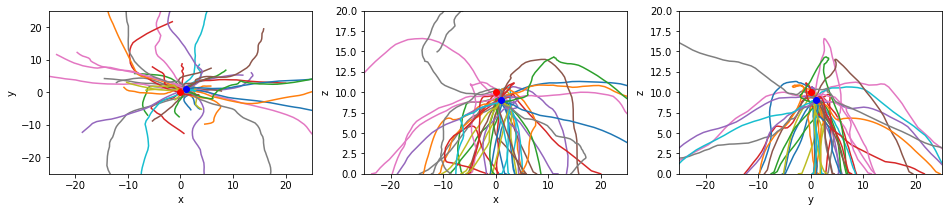

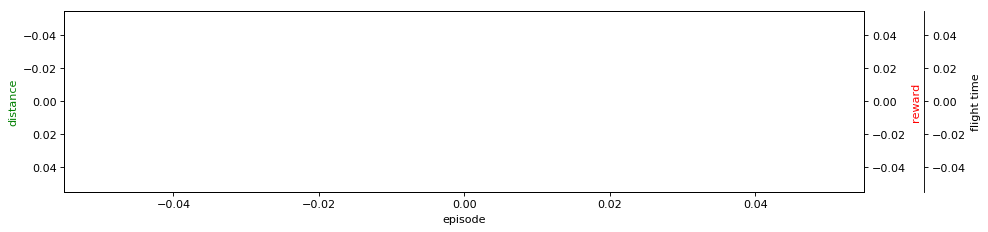

Episode =  101, Reward = 2.75824, Avg Distance = 5.65623, time = 1.62088

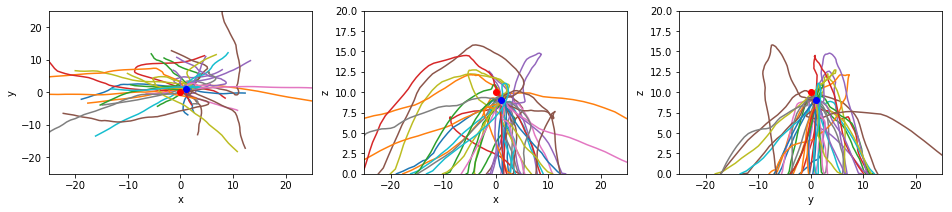

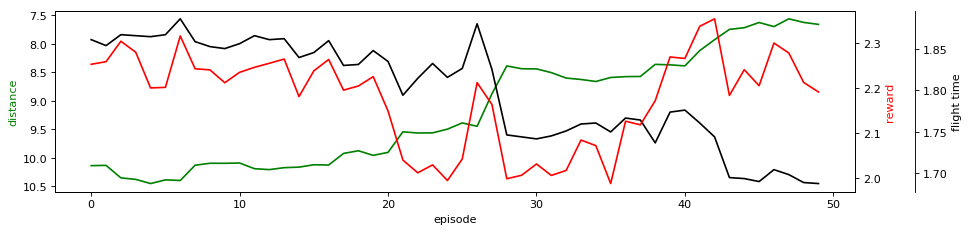

Episode =  151, Reward = -0.393279, Avg Distance = 5.12713, time = 1.028

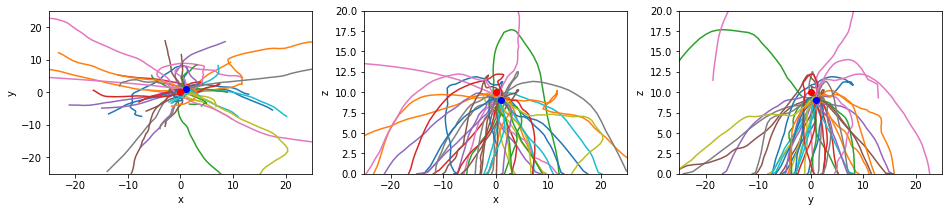

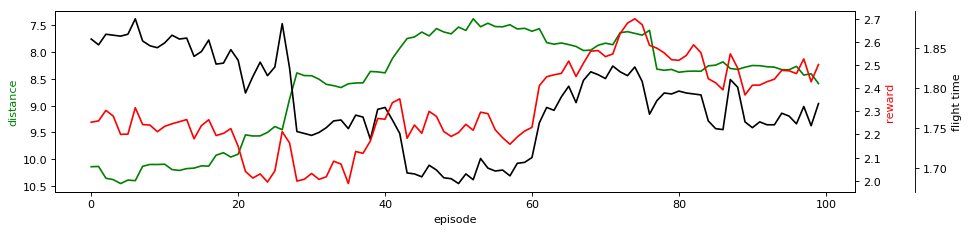

Episode =  201, Reward = 1.75897, Avg Distance = 6.90127, time =  1.262

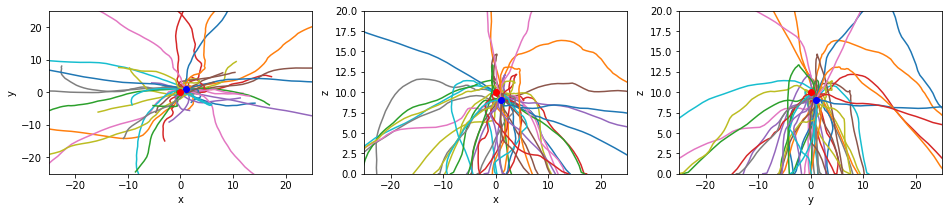

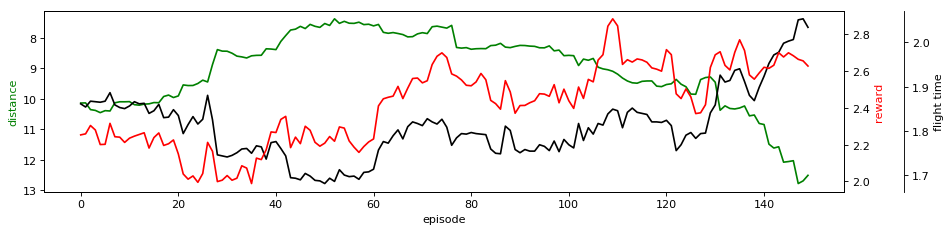

Episode =  251, Reward = 0.858895, Avg Distance = 6.4406, time = 1.32726

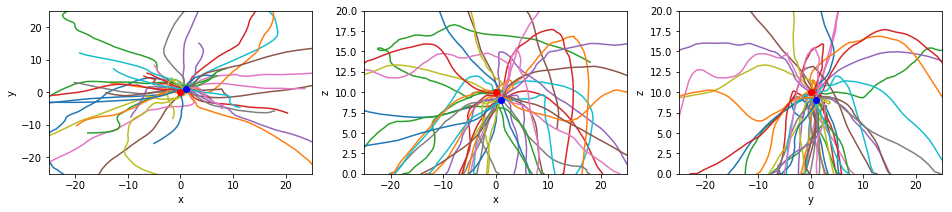

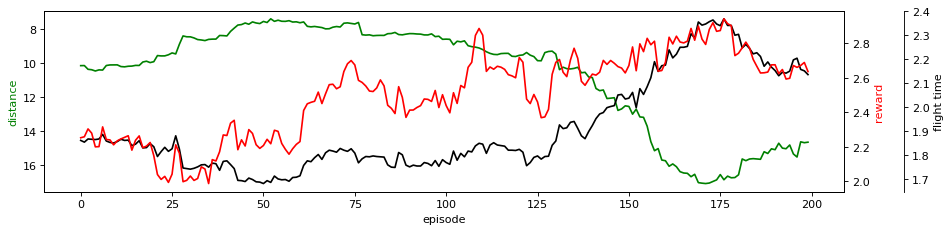

Episode =  301, Reward = 5.06418, Avg Distance = 7.01742, time = 2.3452

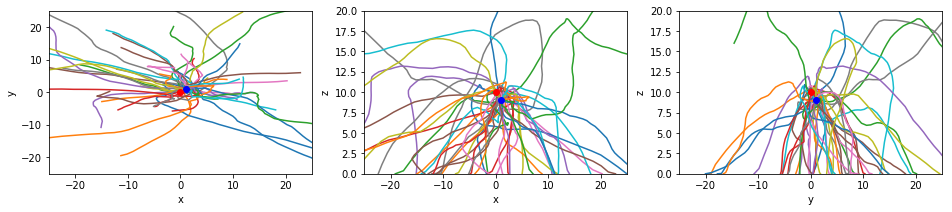

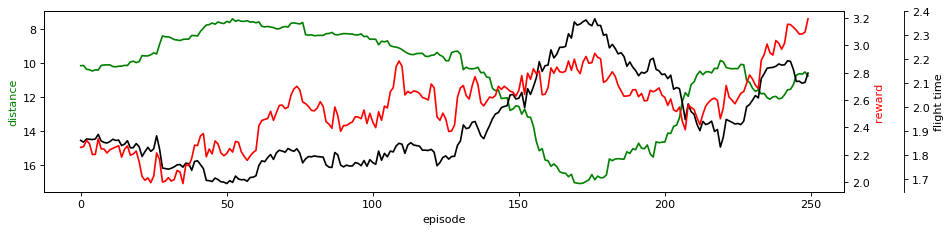

Episode =  351, Reward = -0.796013, Avg Distance = 5.86852, time = 0.96

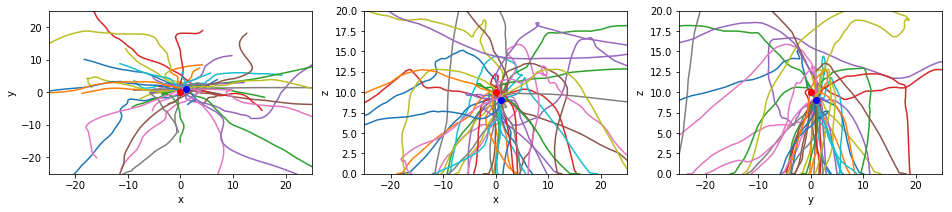

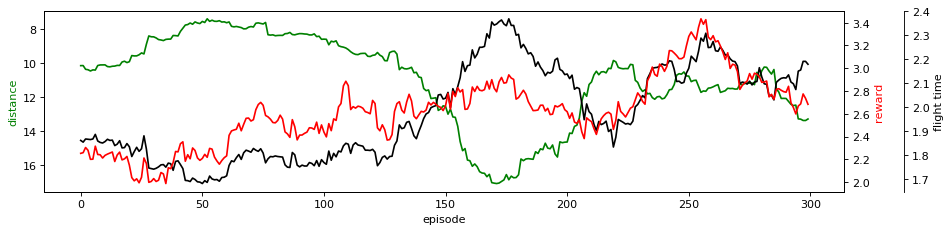

Episode =  401, Reward = -0.262526, Avg Distance = 6.56858, time =  1.5

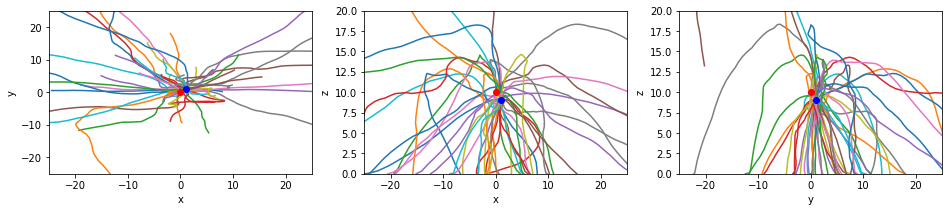

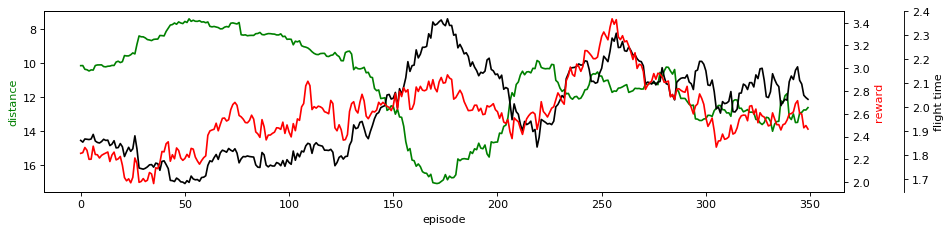

Episode =  451, Reward = 0.202632, Avg Distance = 6.35161, time = 1.3822

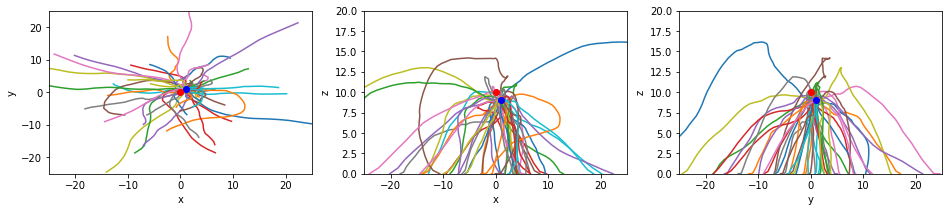

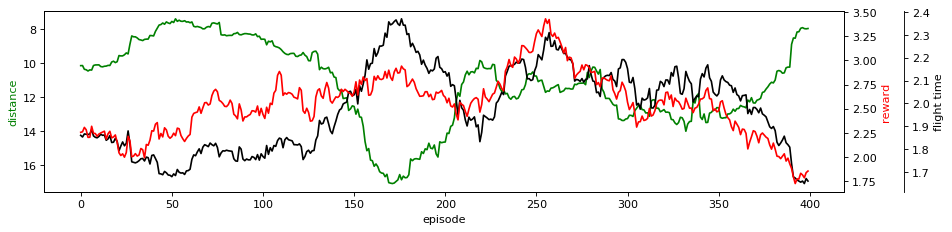

Episode =  501, Reward = 0.880462, Avg Distance = 16.8531, time =  1.86

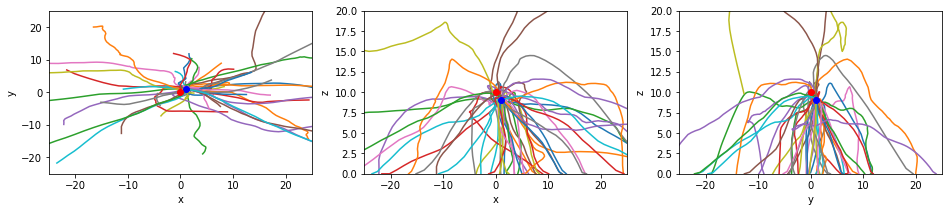

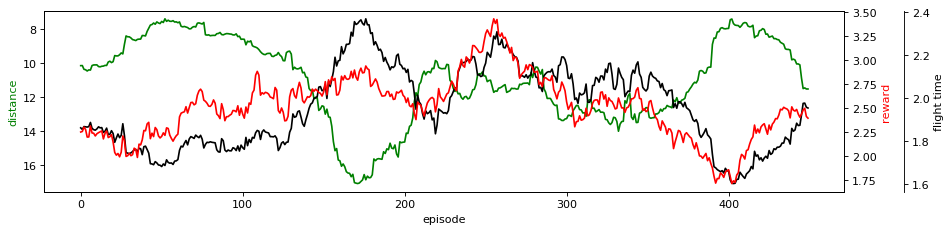

Episode =  551, Reward = 2.71537, Avg Distance = 15.292, time = 1.68.74

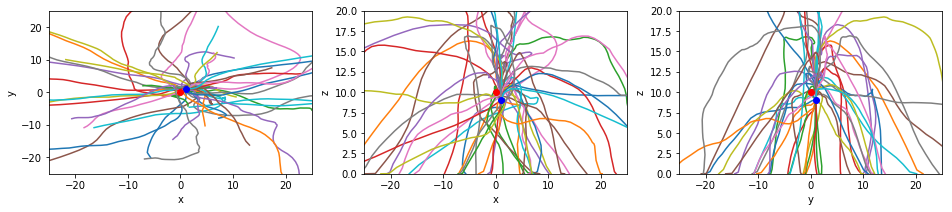

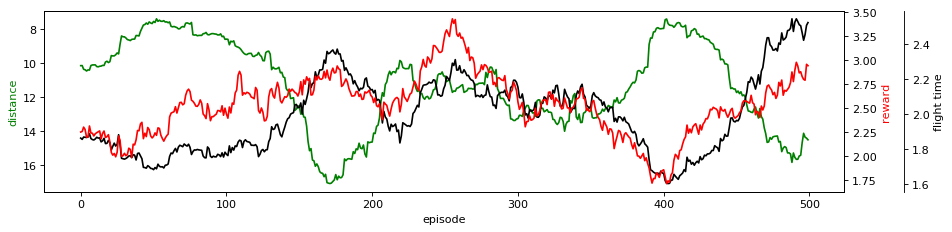

Episode =  601, Reward = 4.37205, Avg Distance = 19.1695, time = 2.6486

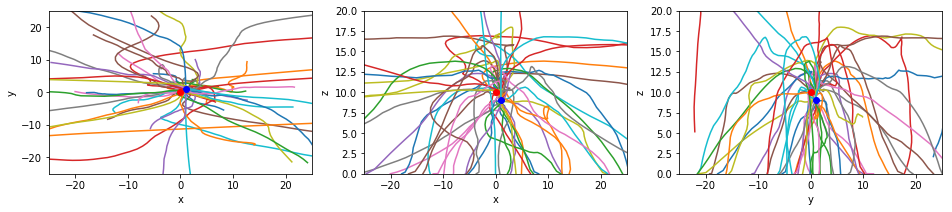

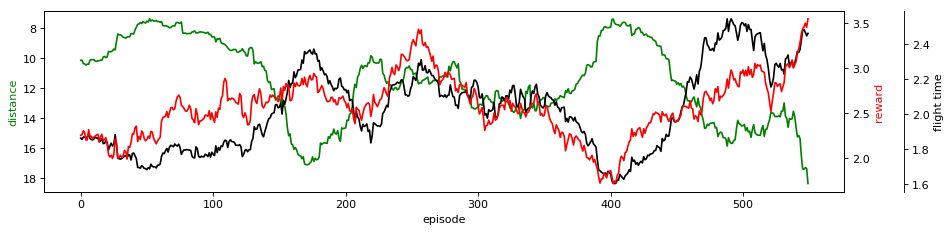

Episode =  651, Reward = 3.81862, Avg Distance = 24.4973, time = 3.848

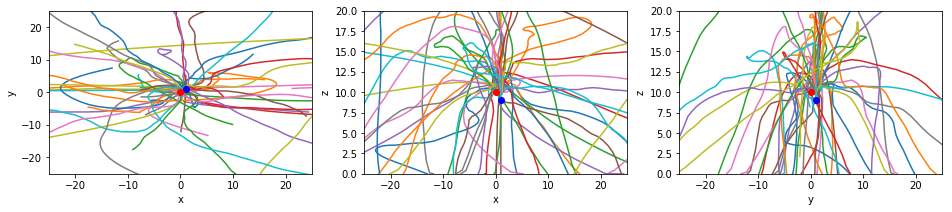

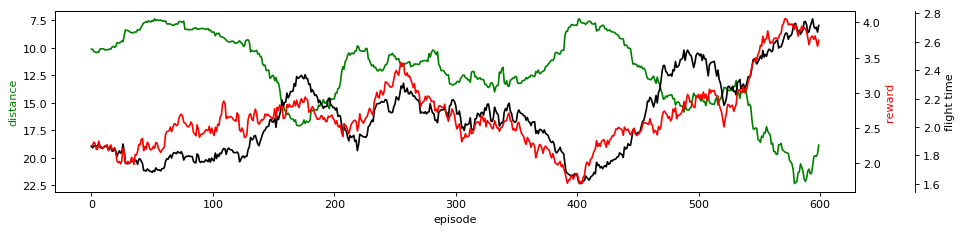

Episode =  701, Reward = 0.950574, Avg Distance = 11.8091, time = 1.5608

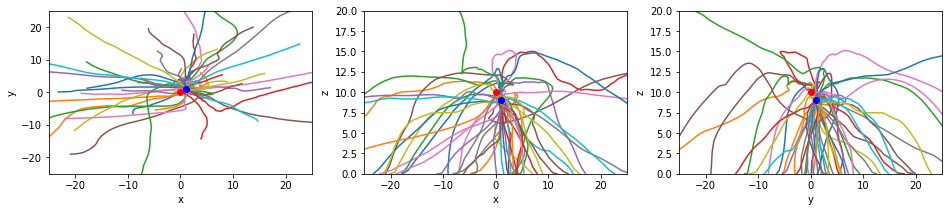

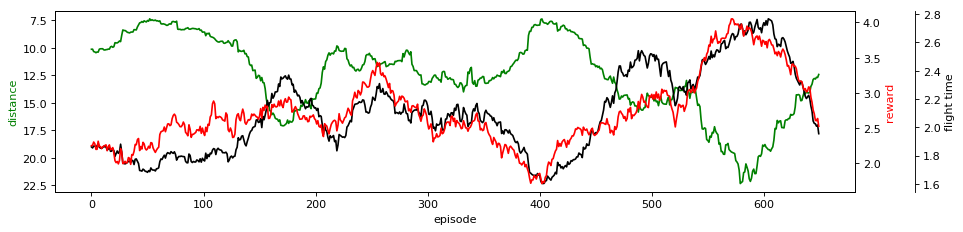

Episode =  751, Reward = 0.061837, Avg Distance = 9.89247, time =  1.862

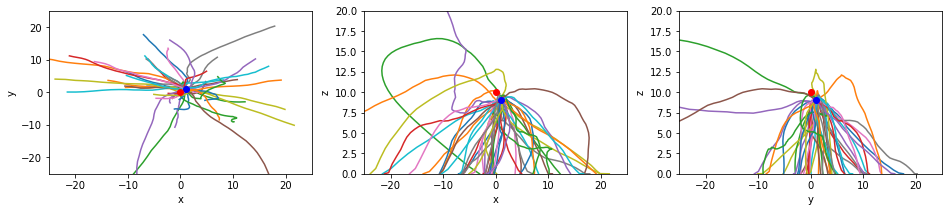

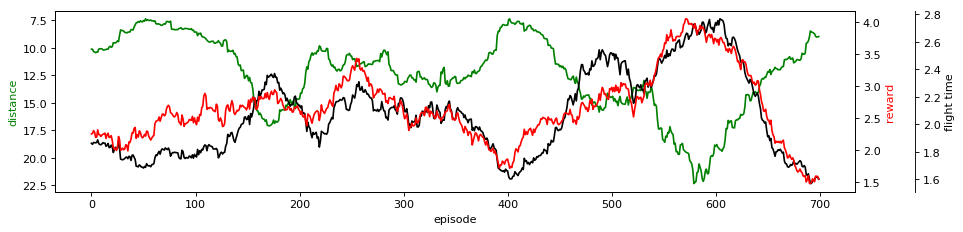

Episode =  801, Reward = 0.808229, Avg Distance = 6.68162, time = 1.2654

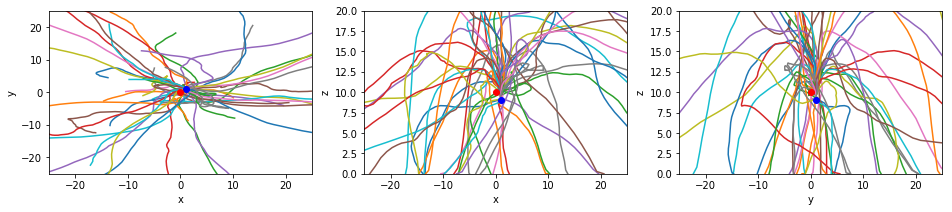

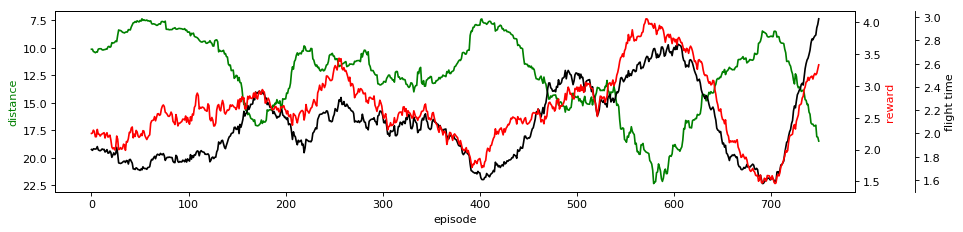

Episode =  851, Reward = 2.66903, Avg Distance = 11.9623, time = 1.74966

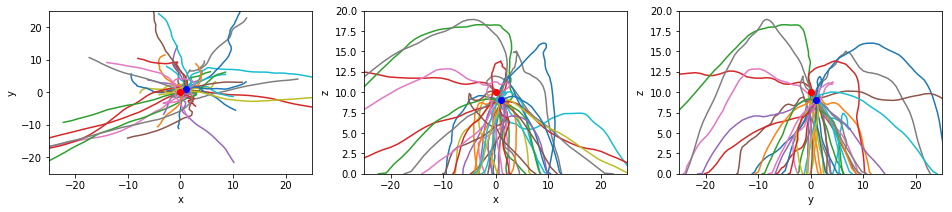

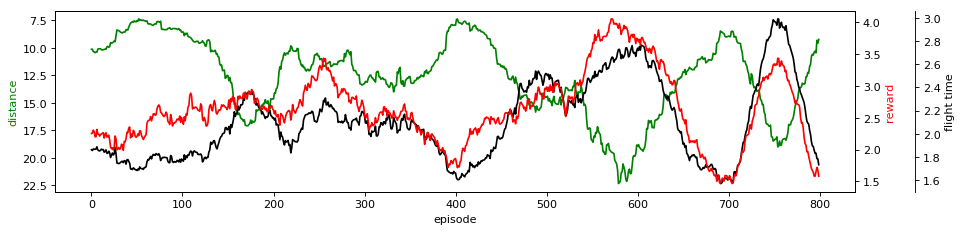

Episode =  901, Reward = -0.361606, Avg Distance = 8.70047, time = 1.146

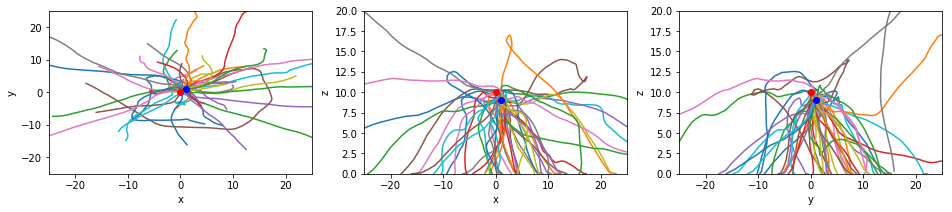

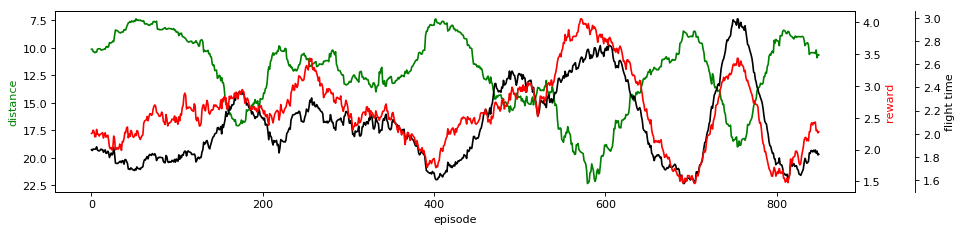

Episode =  951, Reward = 1.47895, Avg Distance = 5.44081, time = 1.74898

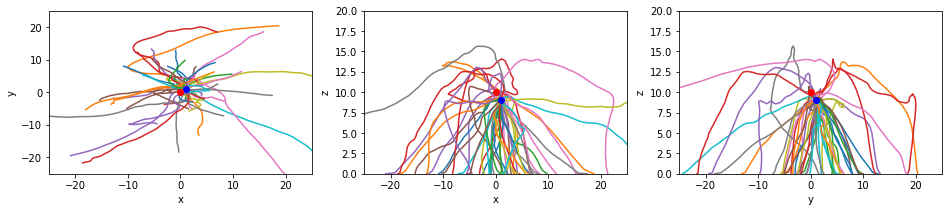

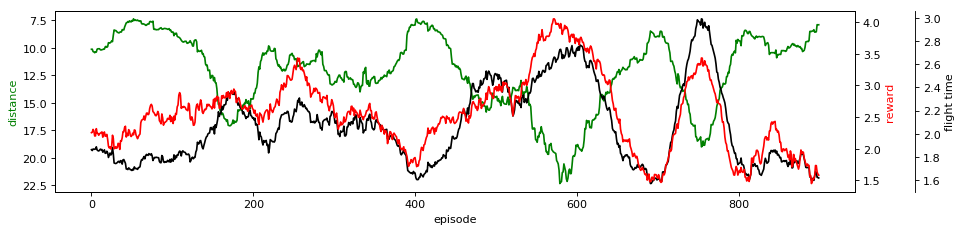

Episode = 1001, Reward = 2.67993, Avg Distance = 6.82064, time = 1.8628

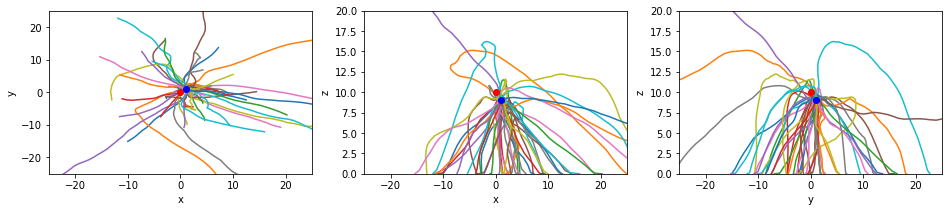

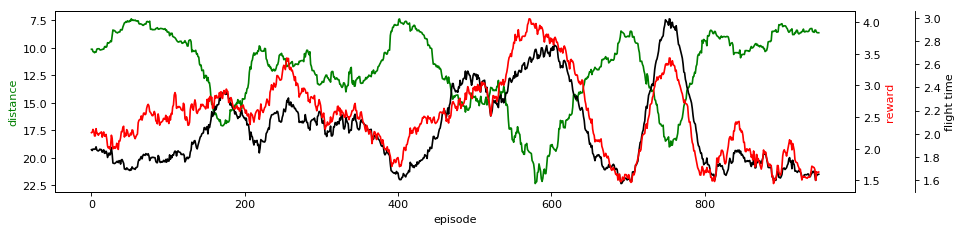

Episode = 1051, Reward = -1.601, Avg Distance = 8.75686, time = 1.148.2

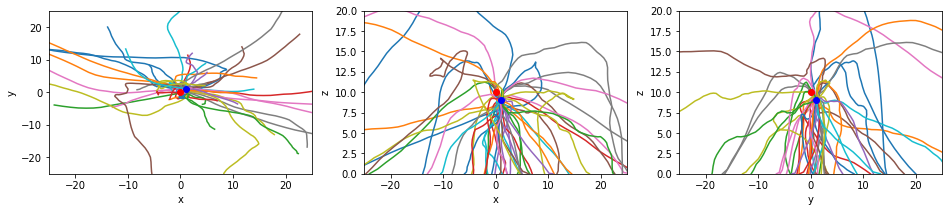

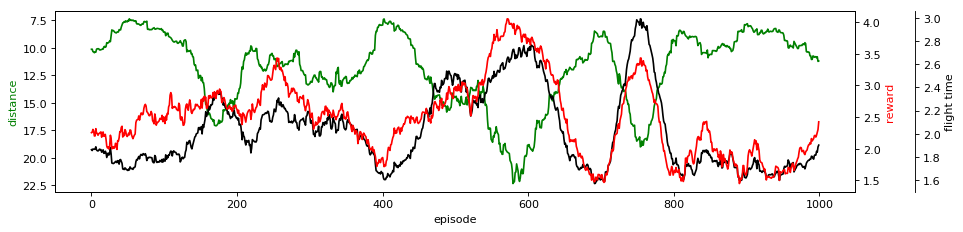

Episode = 1101, Reward = 0.601688, Avg Distance = 5.30428, time = 1.0869

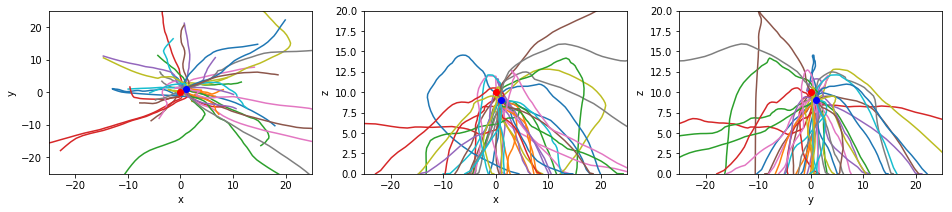

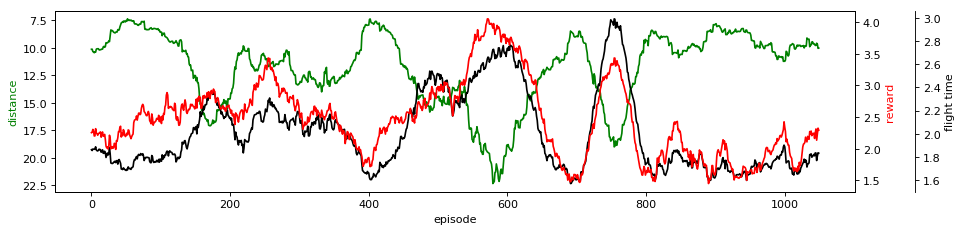

Episode = 1151, Reward = -1.28528, Avg Distance = 12.0984, time = 1.4422

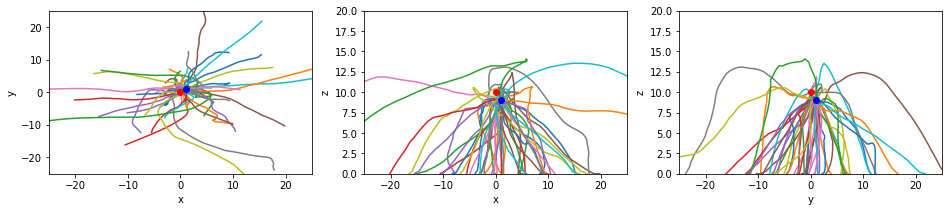

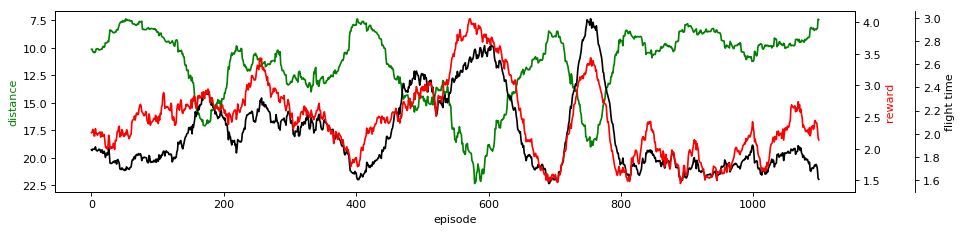

Episode = 1201, Reward = 5.37094, Avg Distance = 3.55204, time = 1.920268

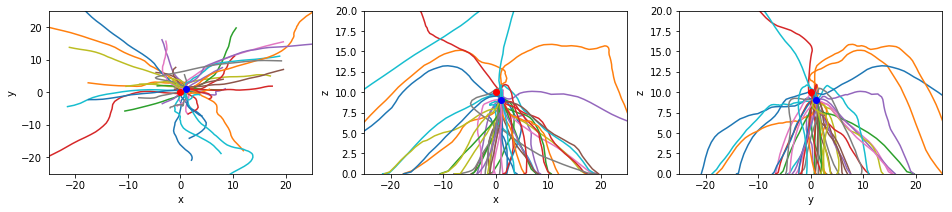

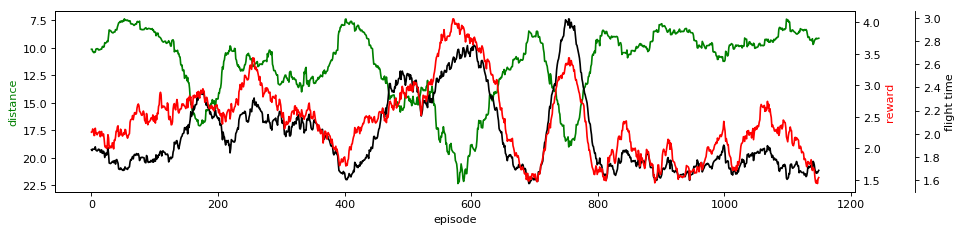

Episode = 1251, Reward = 6.44316, Avg Distance = 9.69333, time = 2.763214

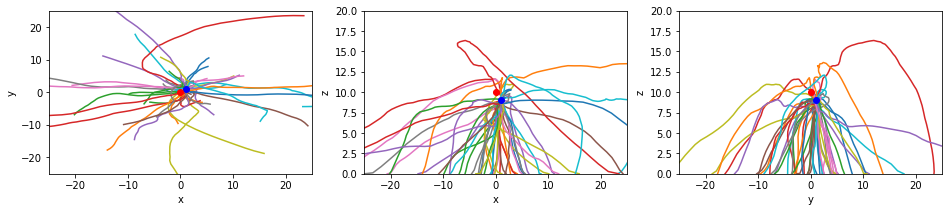

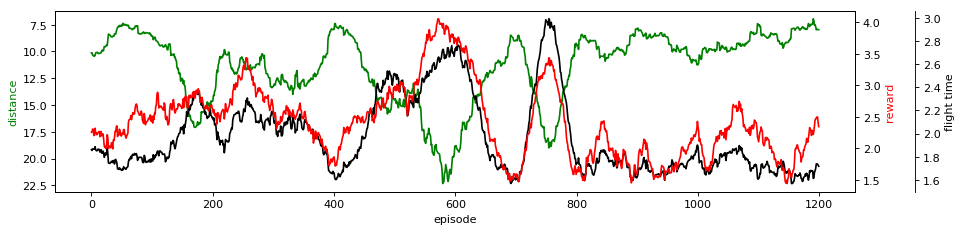

Episode = 1301, Reward = 1.90825, Avg Distance = 6.06989, time = 1.74482

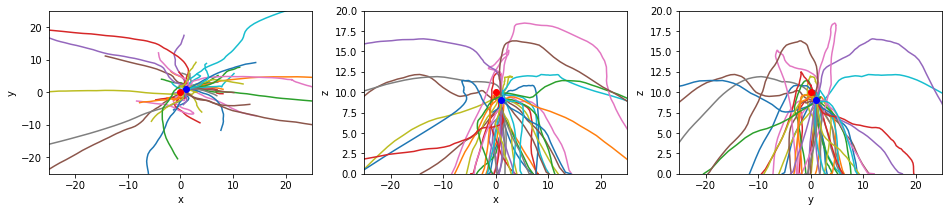

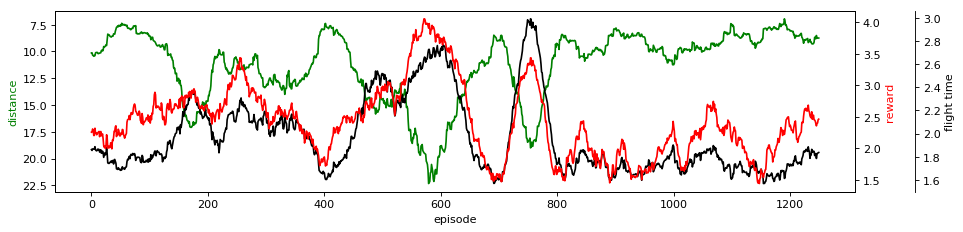

Episode = 1351, Reward = 1.96566, Avg Distance = 4.73922, time = 1.3886

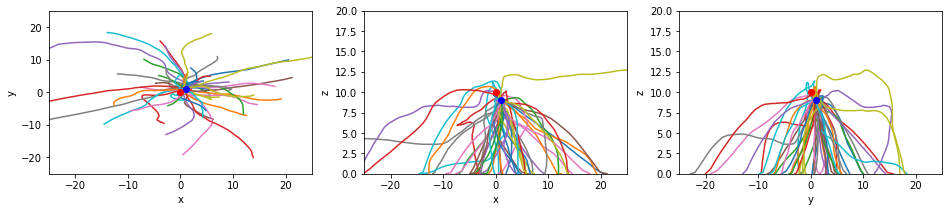

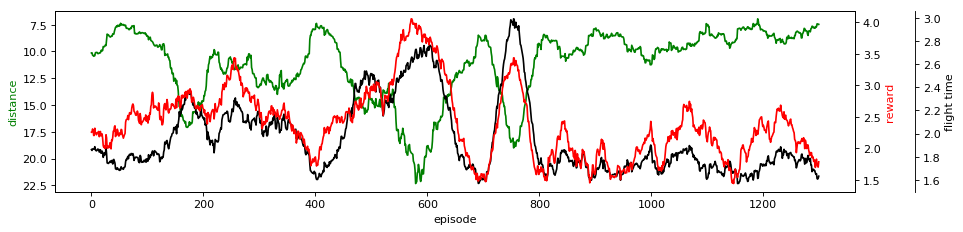

Episode = 1401, Reward = -1.26994, Avg Distance = 6.41116, time = 0.9644

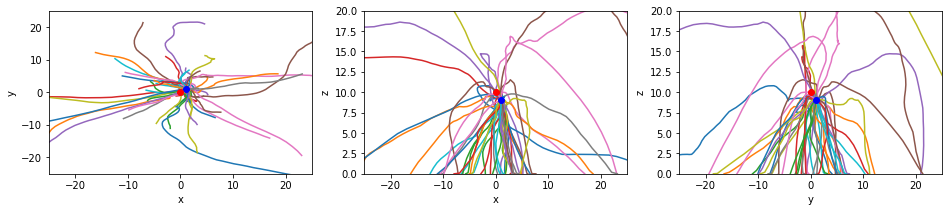

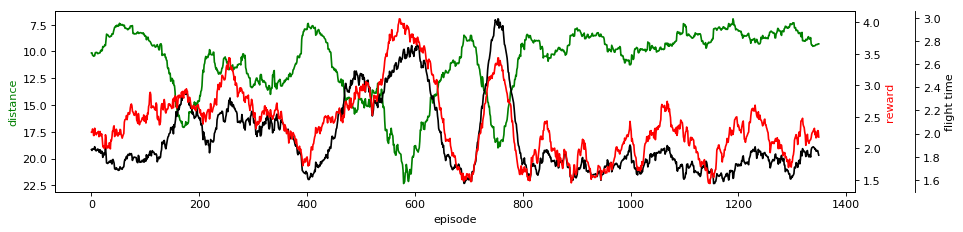

Episode = 1451, Reward = 1.68801, Avg Distance = 7.01194, time = 1.9266

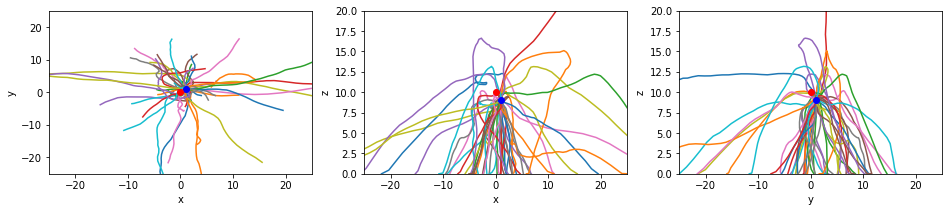

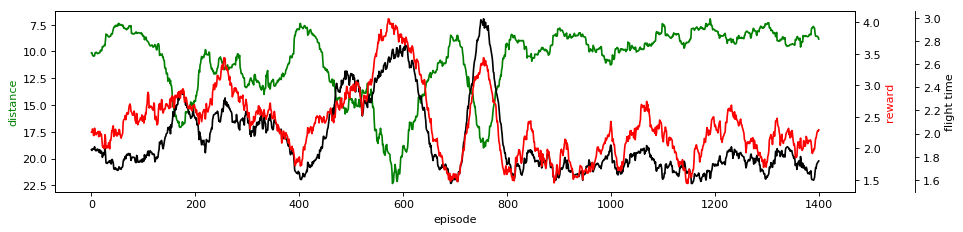

Episode = 1501, Reward = 1.80855, Avg Distance = 19.8611, time = 2.58222

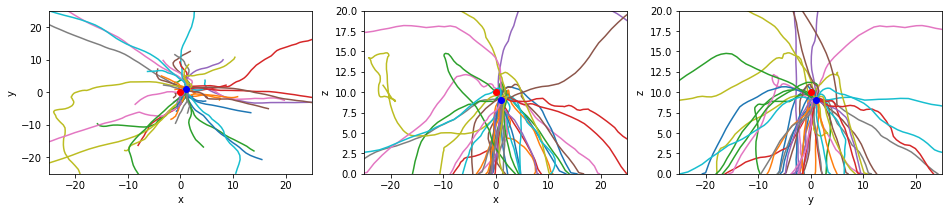

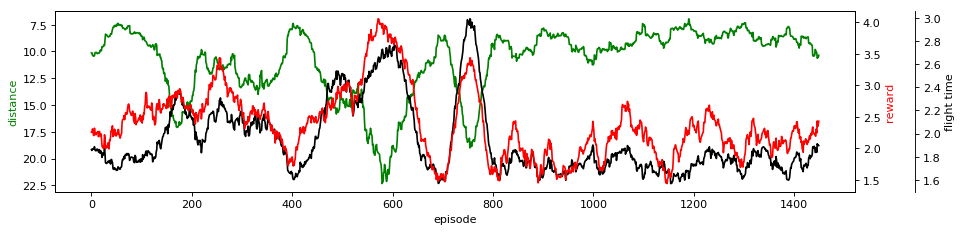

Episode = 1551, Reward = 3.29854, Avg Distance = 6.40789, time = 1.86544

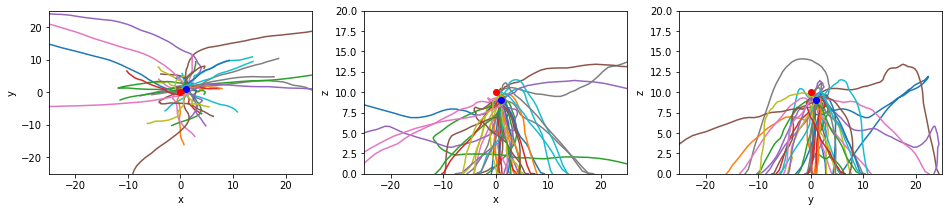

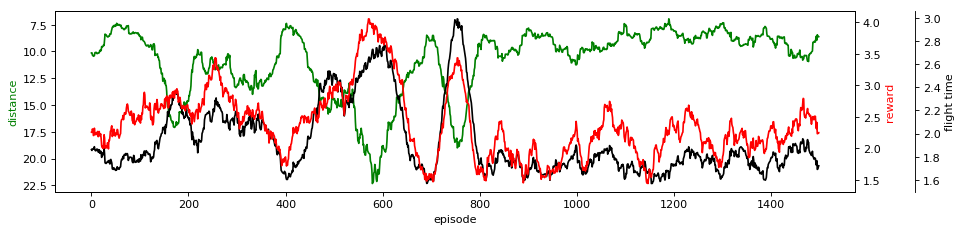

Episode = 1601, Reward = 8.26415, Avg Distance = 9.75674, time = 3.12626

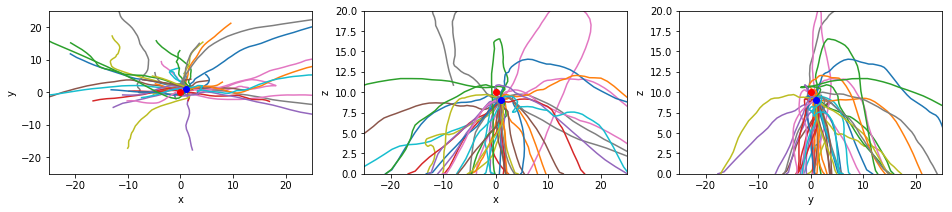

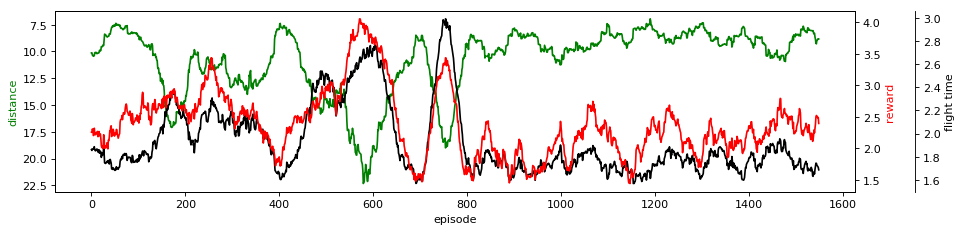

Episode = 1651, Reward = 2.2475, Avg Distance = 17.2681, time = 1.869.54

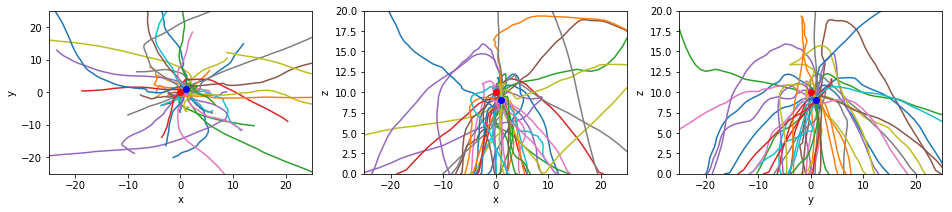

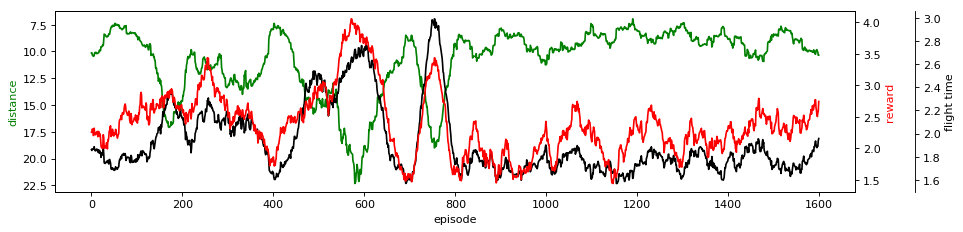

Episode = 1701, Reward = -0.90034, Avg Distance = 7.03068, time =  1.222

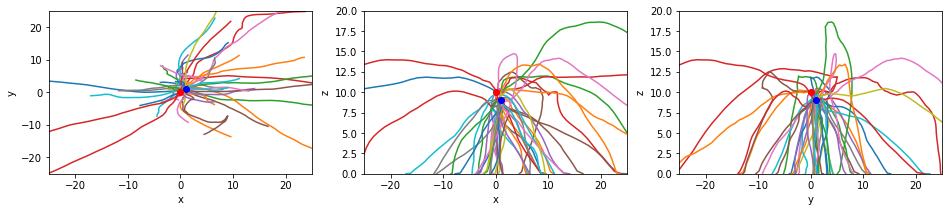

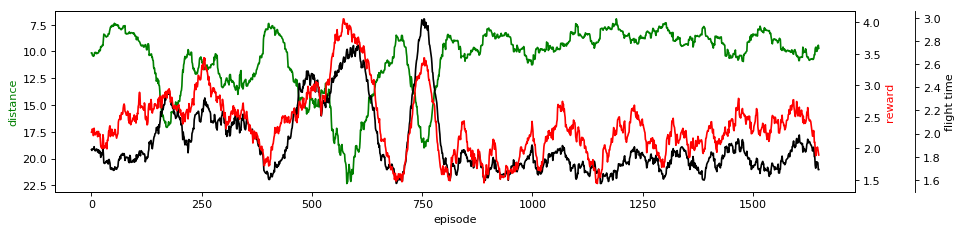

Episode = 1751, Reward = 3.74012, Avg Distance = 13.4285, time = 3.06868

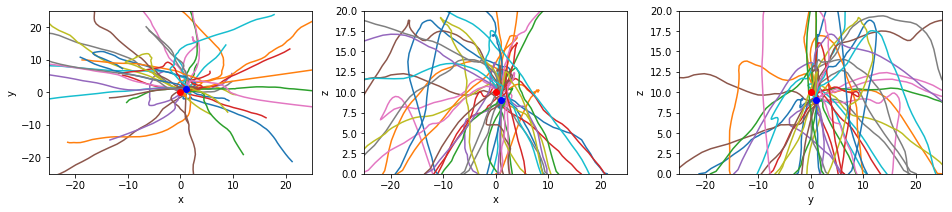

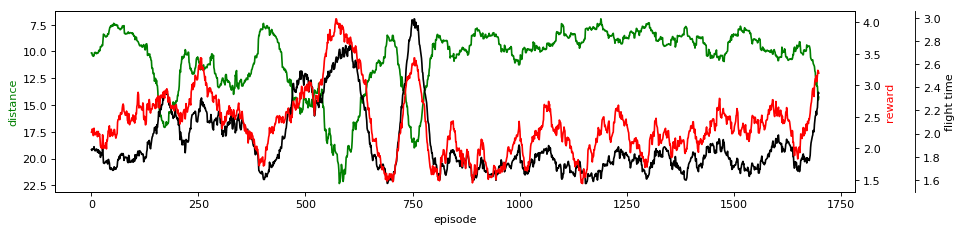

Episode = 1801, Reward = 1.61406, Avg Distance = 5.58977, time = 1.74222

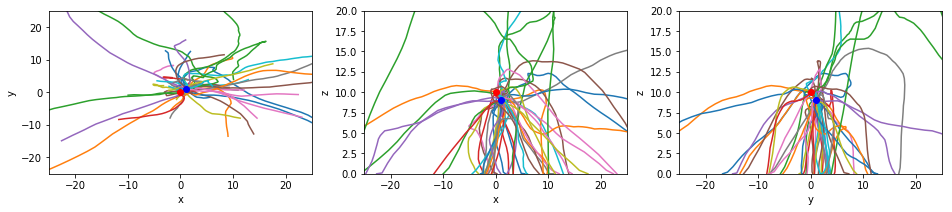

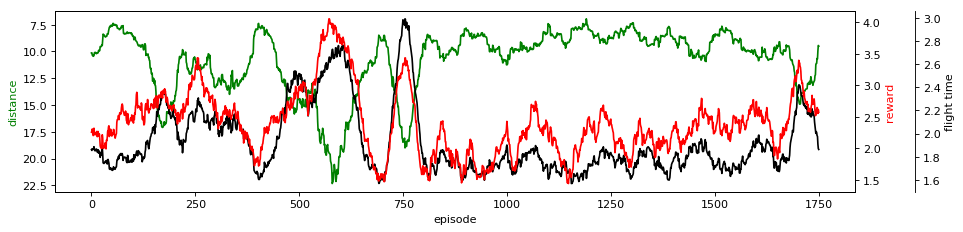

Episode = 1851, Reward = 2.17232, Avg Distance = 7.83093, time = 1.56.84

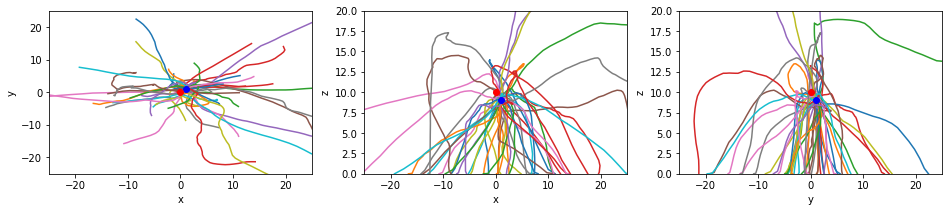

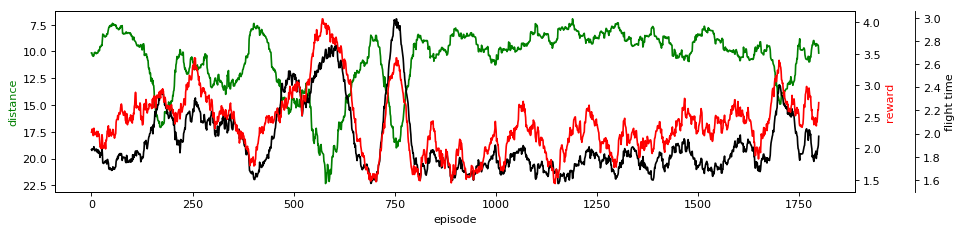

Episode = 1901, Reward = 8.29388, Avg Distance = 40.0621, time = 5.04.9

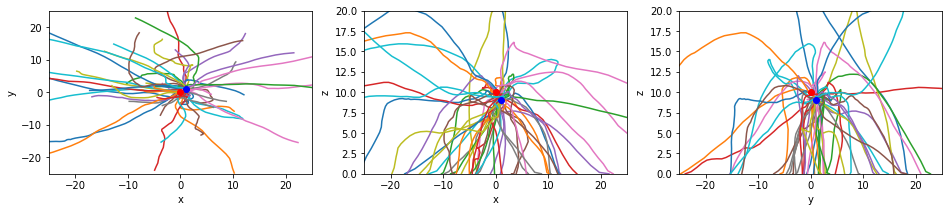

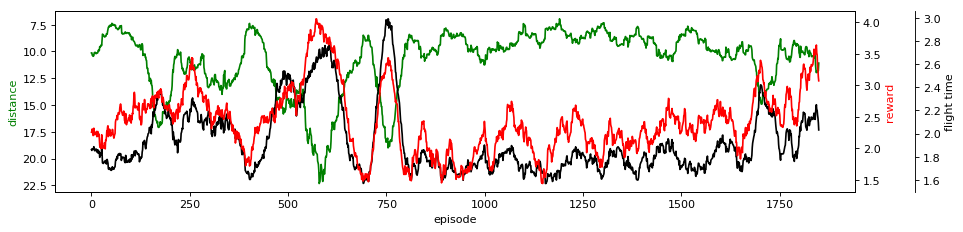

Episode = 1951, Reward = 0.766536, Avg Distance = 10.5394, time = 1.926

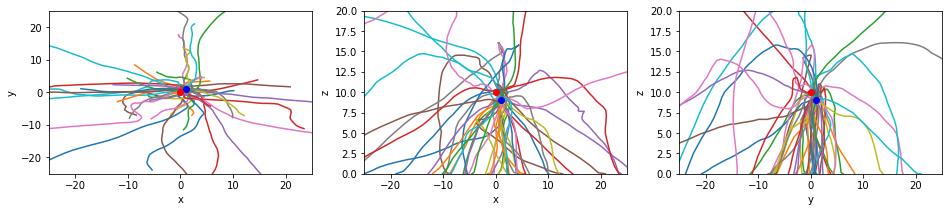

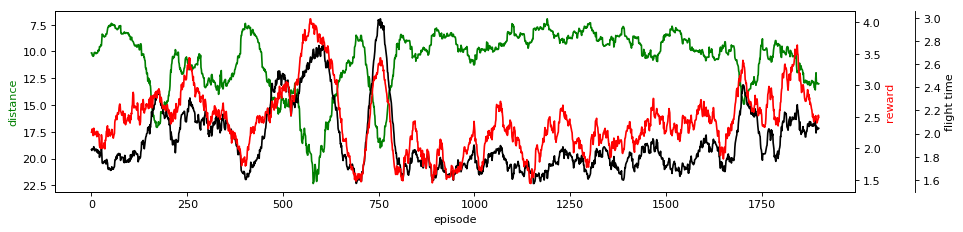

Episode = 2001, Reward = -0.0374335, Avg Distance = 7.69657, time = 1.38

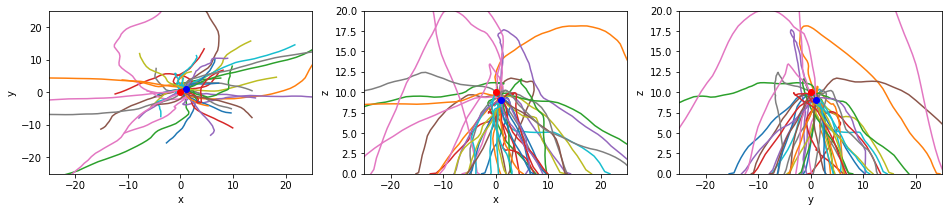

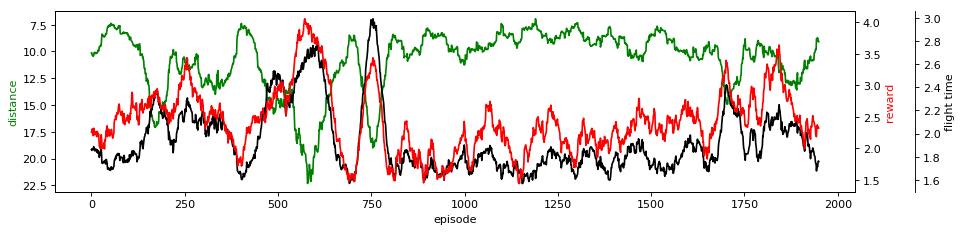

Episode = 2051, Reward = -1.3351, Avg Distance = 5.62905, time = 0.72508

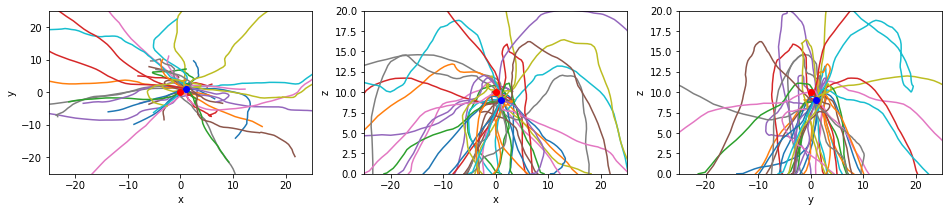

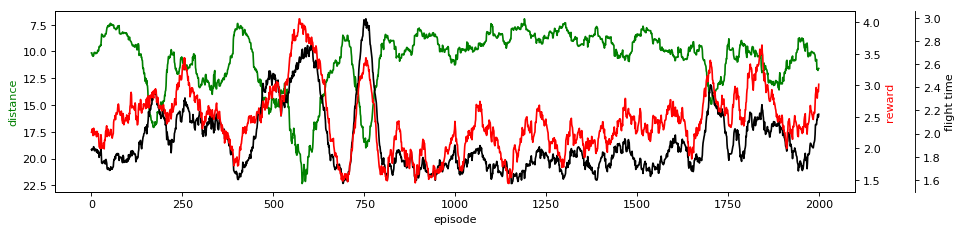

Episode = 2101, Reward = 0.694511, Avg Distance = 11.5581, time =  1.28.96

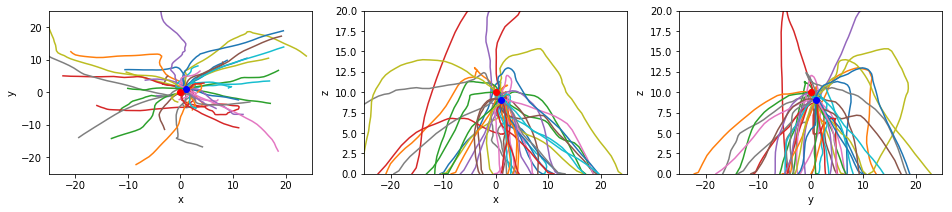

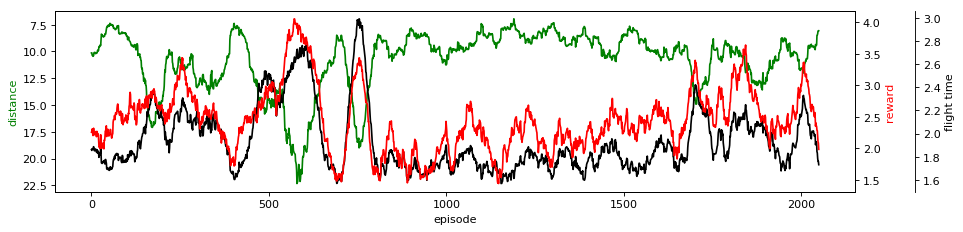

Episode = 2151, Reward = 6.13617, Avg Distance = 41.0747, time = 5.04462

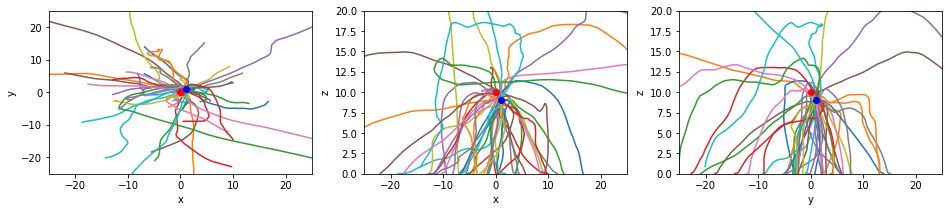

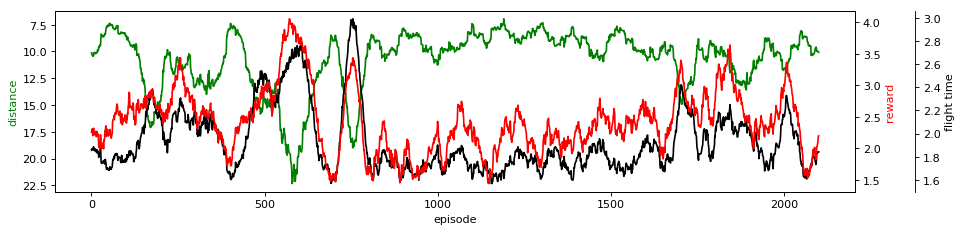

Episode = 2201, Reward = 0.220201, Avg Distance = 4.6885, time = 1.0868

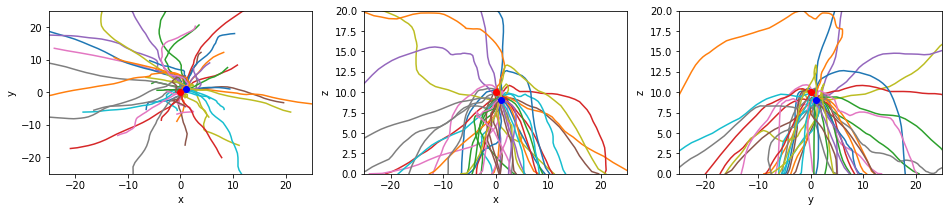

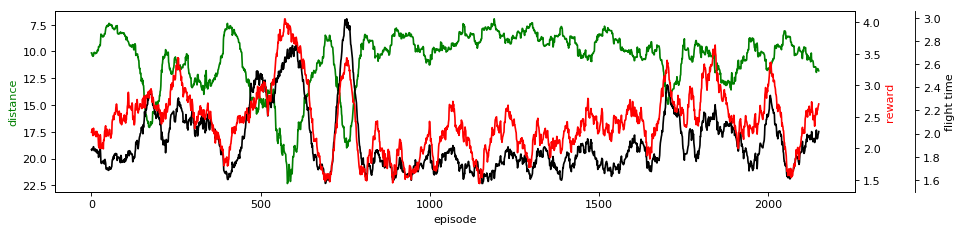

Episode = 2251, Reward = 5.00294, Avg Distance = 5.8317, time = 2.28026

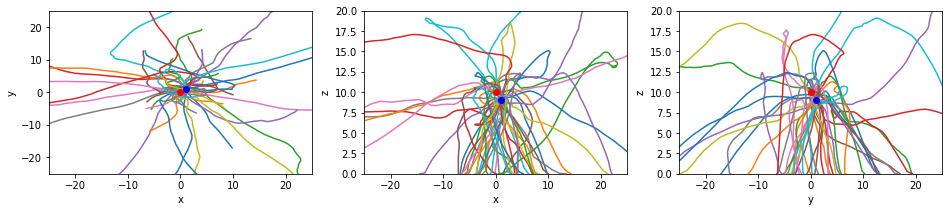

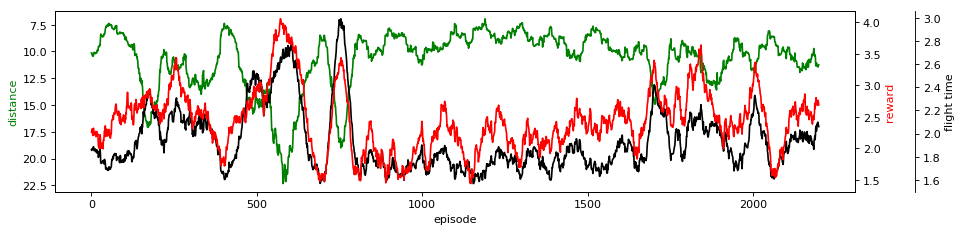

Episode = 2301, Reward = 3.27526, Avg Distance = 16.934, time = 3.24461.38

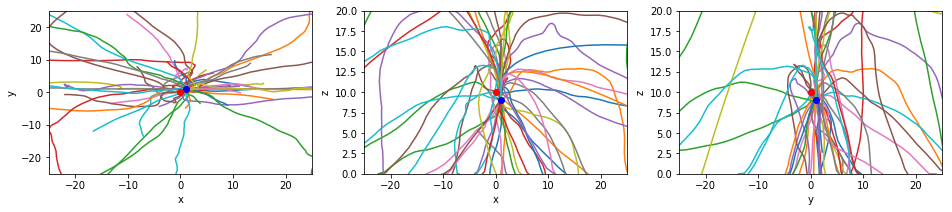

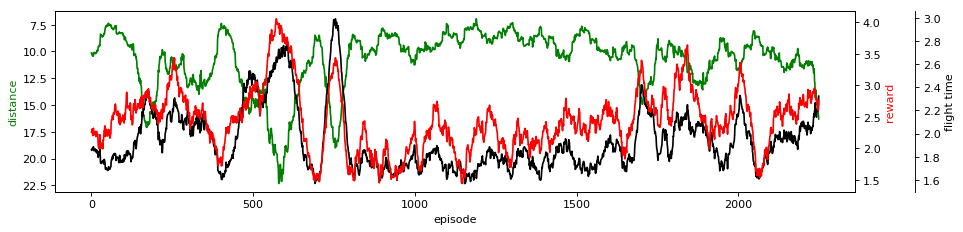

Episode = 2351, Reward = 1.90464, Avg Distance = 32.2745, time =    34

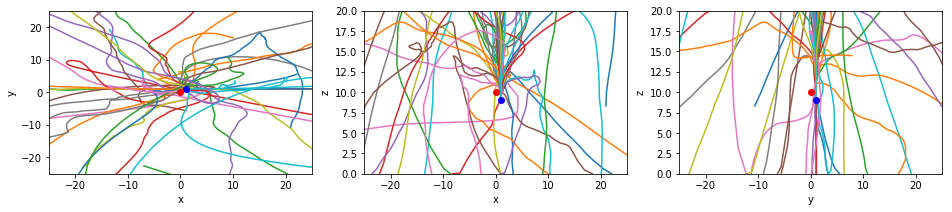

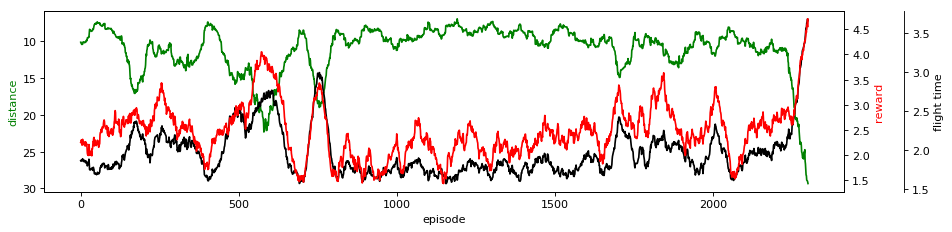

Episode = 2401, Reward = 7.71877, Avg Distance = 30.0913, time = 5.043

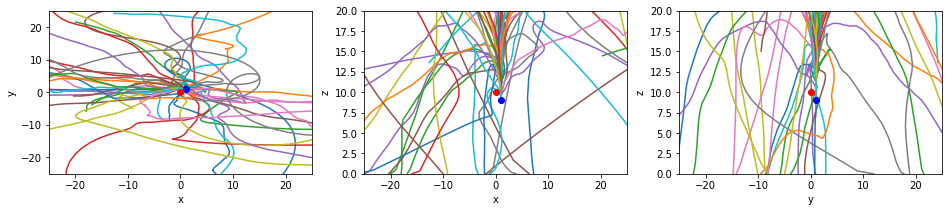

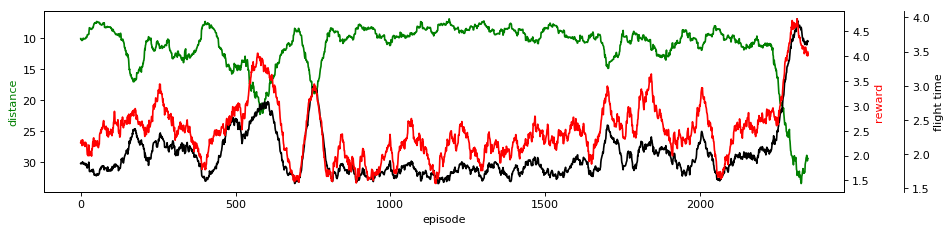

Episode = 2451, Reward = 3.43197, Avg Distance = 49.6474, time = 4.868

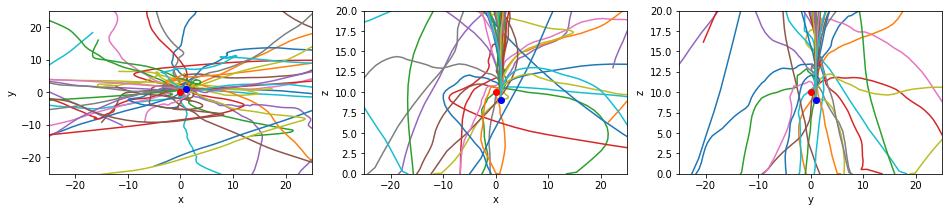

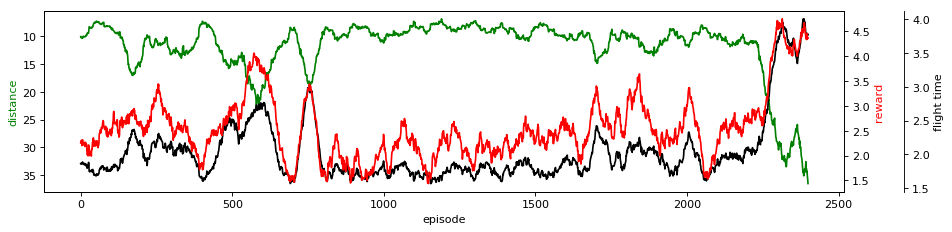

Episode = 2501, Reward = 3.93948, Avg Distance = 22.5956, time = 3.066

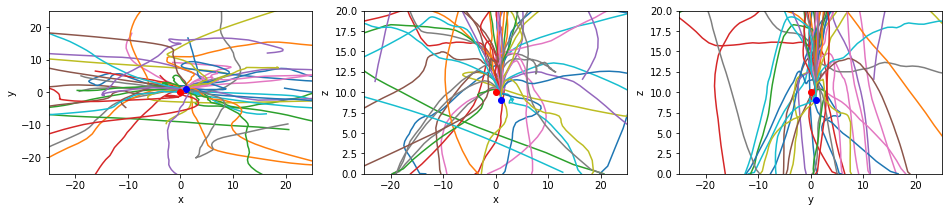

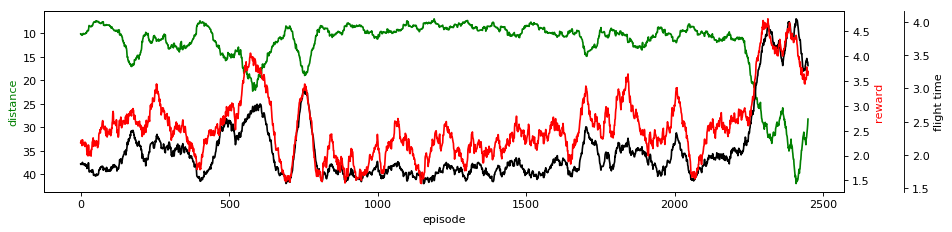

Episode = 2551, Reward = 4.94394, Avg Distance = 54.7587, time = 5.048

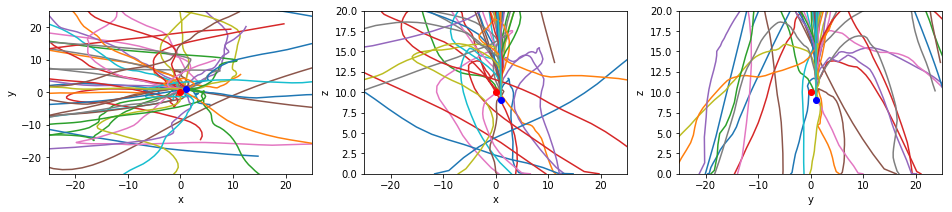

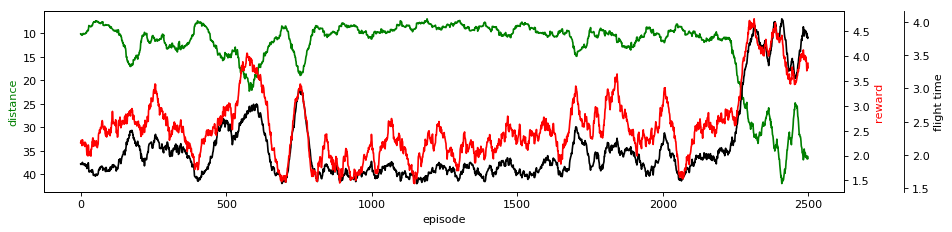

Episode = 2601, Reward = 3.5868, Avg Distance = 8.21222, time = 2.16244

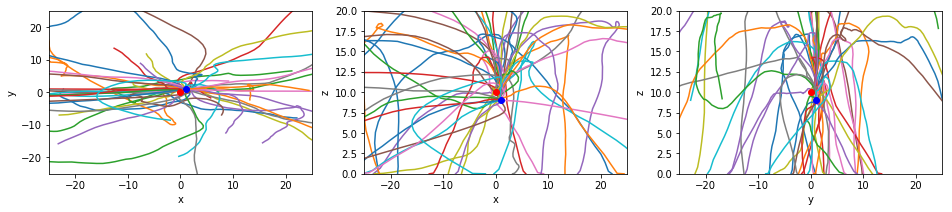

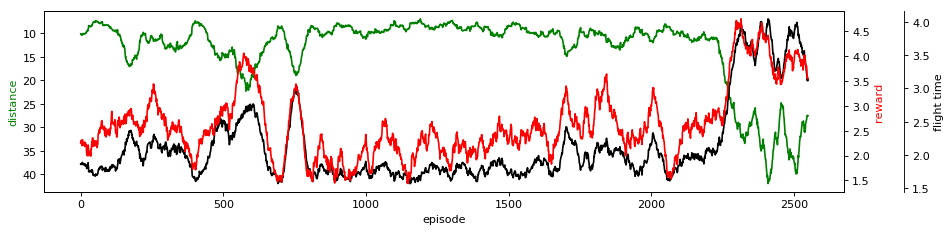

Episode = 2651, Reward = 7.24539, Avg Distance = 54.7286, time = 5.04269

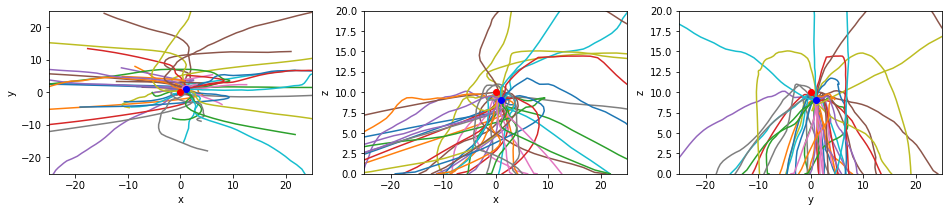

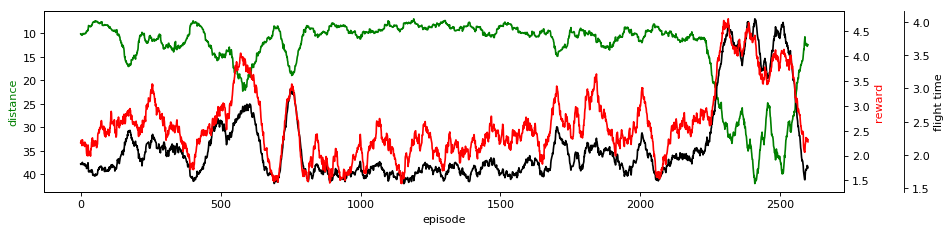

Episode = 2701, Reward = 1.56775, Avg Distance = 33.1217, time = 2.04.5

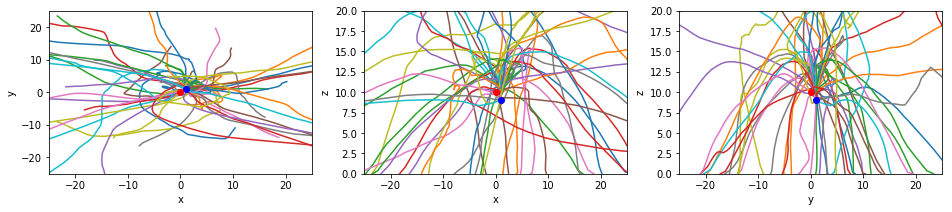

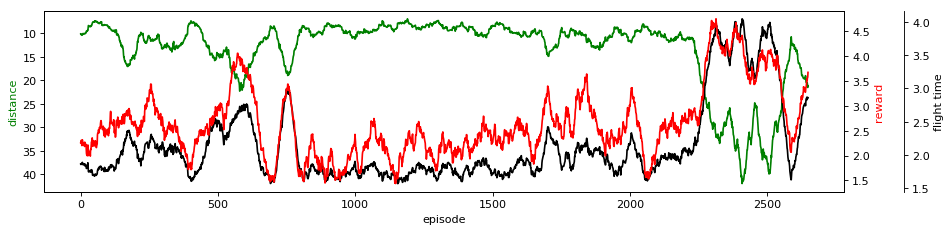

Episode = 2751, Reward = 0.52471, Avg Distance = 6.44974, time = 1.08462

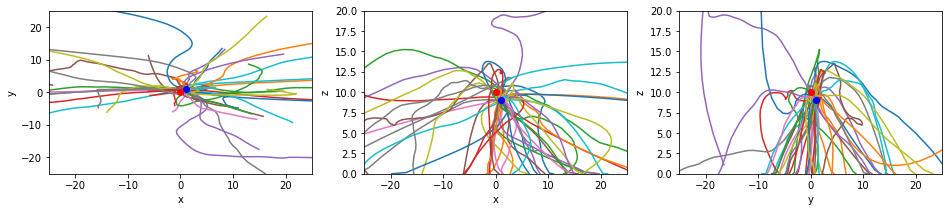

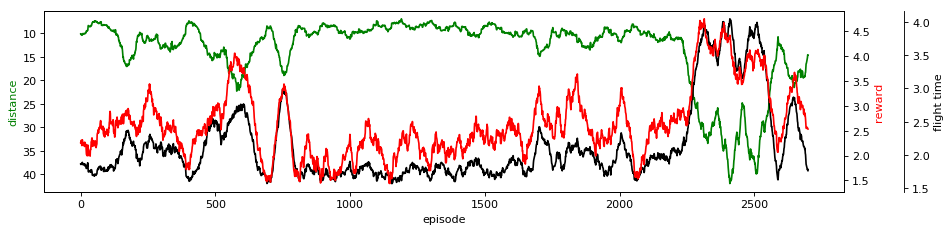

Episode = 2801, Reward = 1.07252, Avg Distance = 16.3282, time = 1.26.56

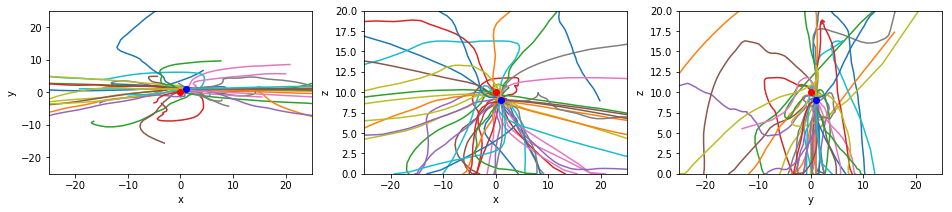

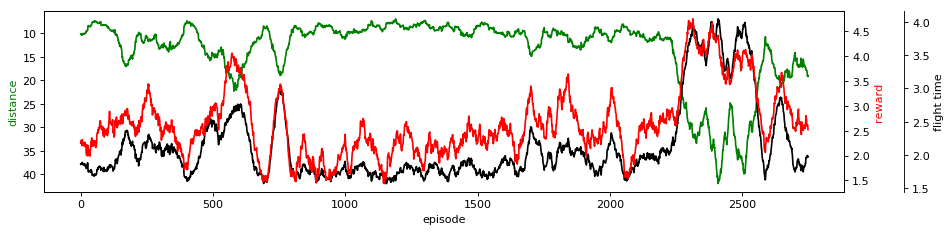

Episode = 2851, Reward = 3.32936, Avg Distance = 8.75388, time = 1.9294

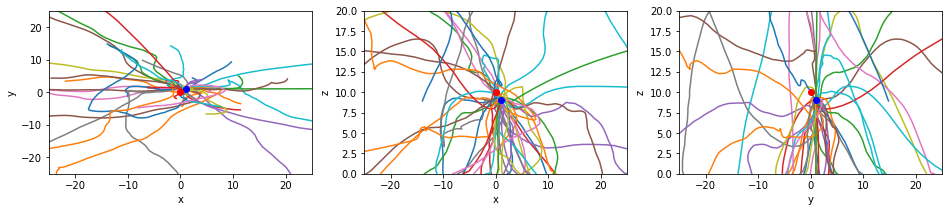

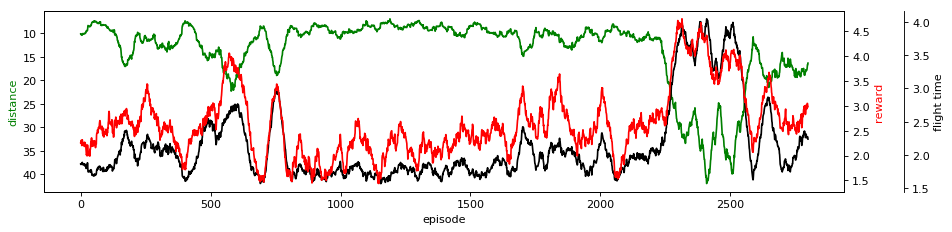

Episode = 2901, Reward = 1.0729, Avg Distance = 6.22196, time = 1.3214814

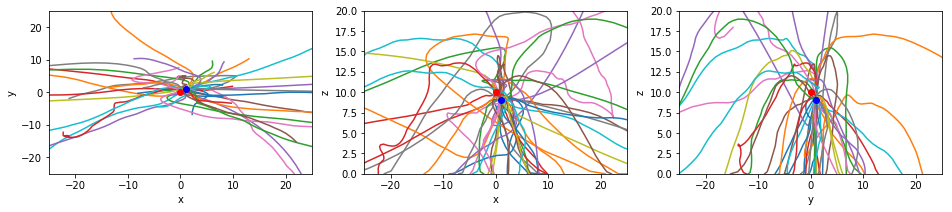

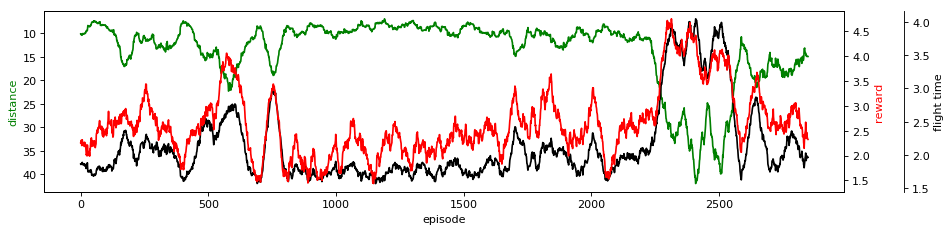

Episode = 2951, Reward = 0.945261, Avg Distance = 6.95793, time = 0.968.2

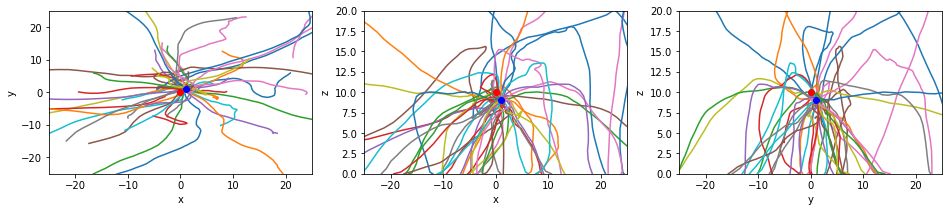

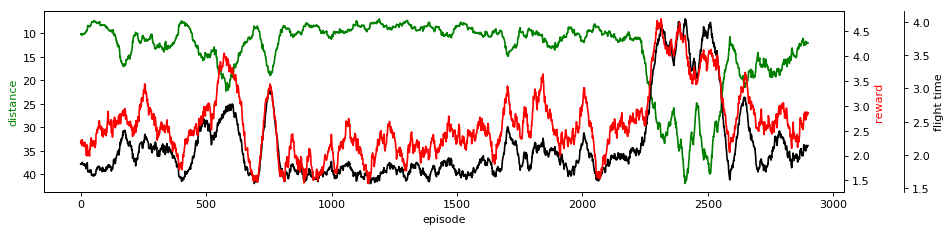

Episode = 3000, Reward = 0.878673, Avg Distance = 17.5287, time = 1.868

In [1]:
import driver
import numpy as np

import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline

running_size = 50
sample_distance = 50
num_episodes = 3000

def plot(_init, poss, _target, rewards, distances, times, running_reward, running_time, running_distance):
#     fig = plt.figure()
#     ax = fig.gca(projection='3d')
#     ax.scatter(*_init, c='b', marker='o')
#     ax.scatter(*_target, c='r', marker='o')
#     x, y, z = zip(*poss)
#     ax.plot(x, y, z)

#     plt.show()
    
    fig = plt.figure()
    ax = fig.gca()
    fig.set_figwidth(16)
    fig.set_figheight(3)
    
    
    ax_xy = plt.subplot(1, 3, 1)
    ax_xz = plt.subplot(1, 3, 2)
    ax_yz = plt.subplot(1, 3, 3)
    for i in range(len(poss)):
        x, y, z = zip(*poss[i])
        ax_xy.plot(x, y)
        ax_xz.plot(x, z)
        ax_yz.plot(y, z)

    ax_xy.scatter(_init[0], _init[1], c='b', marker='o', zorder=100)
    ax_xy.scatter(_target[0], _target[1], c='r', marker='o', zorder=100)
    ax_xy.set_xlabel("x")
    ax_xy.set_ylabel("y")
    ax_xy.set_xlim((-25, 25))
    ax_xy.set_ylim((-25, 25))

    ax_xz.scatter(_init[0], _init[2], c='b', marker='o', zorder=100)
    ax_xz.scatter(_target[0], _target[2], c='r', marker='o', zorder=100)
    ax_xz.set_xlabel("x")
    ax_xz.set_ylabel("z")
    ax_xz.set_xlim((-25, 25))
    ax_xz.set_ylim((0, 20))

    ax_yz.scatter(_init[1], _init[2], c='b', marker='o', zorder=100)
    ax_yz.scatter(_target[1], _target[2], c='r', marker='o', zorder=100)
    ax_yz.set_xlabel("y")
    ax_yz.set_ylabel("z")
    ax_yz.set_xlim((-25, 25))
    ax_yz.set_ylim((0, 20))

    plt.show()
    
    fig, host = plt.subplots()
    fig.subplots_adjust(right=0.75)
    fig.set_figwidth(16)
    fig.set_figheight(3)
    fig.set_dpi(80)

    par1 = host.twinx()
    par2 = host.twinx()
    
#     p3, = par2.plot(rewards, color='red', linestyle='dotted', label='reward')
    p3, = par2.plot(running_reward[sample_distance+1:], color='red', label='running rewards', zorder=100)
    
#     p4, = par1.plot(times, color='black', linestyle='dotted', label='flight time')
    p4, = par1.plot(running_time[sample_distance+1:], color='black', label='running time', zorder=50)
    
#     p5, = host.plot(distances, color='green', linestyle='dotted', label='distance')
    p5, = host.plot(running_distance[sample_distance+1:], color='green', label='running distance', zorder=50)
    host.invert_yaxis()

    par2.yaxis.label.set_color(p3.get_color())
    par1.yaxis.label.set_color(p4.get_color())
    host.yaxis.label.set_color(p5.get_color())

    par2.set_ylabel("reward")
    par1.set_ylabel("flight time")
    host.set_ylabel("distance")
    host.set_xlabel("episode")
    
    par2.spines["right"].set_position(("axes", 1))
    par1.spines["right"].set_position(("axes", 1.075))

    plt.show()
    
print()

epi_init_pos, epi_positions, target_pos, rewards, distances, times, running_reward, running_time, running_distance = driver.drive(
    num_episodes=num_episodes,
    sample_distance=sample_distance,
    task_renew_distance=num_episodes,
    initial_pos=np.array([1., 1., 9.]),
    target_pos=np.array([0., 0., 10.]),
    sample_cb=plot,
    running_size=running_size
)

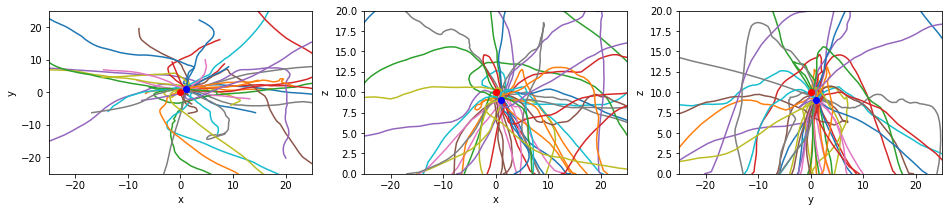

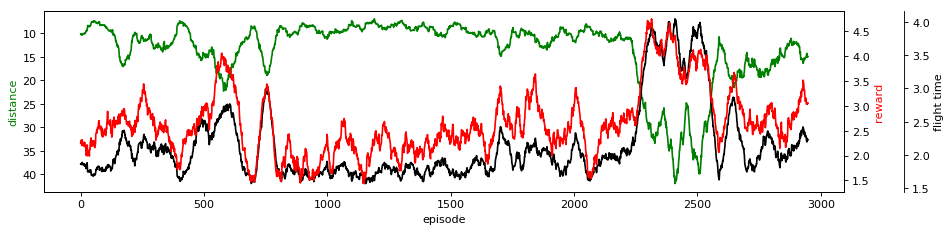

In [2]:
plot(epi_init_pos, epi_positions, target_pos, rewards, distances, times, running_reward, running_time, running_distance)

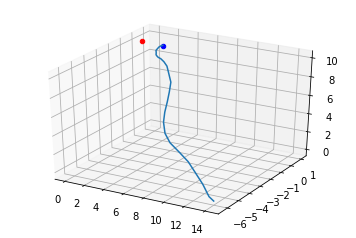

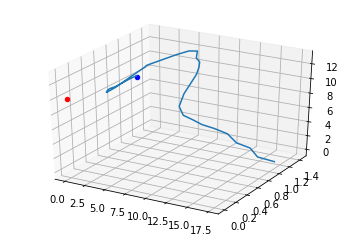

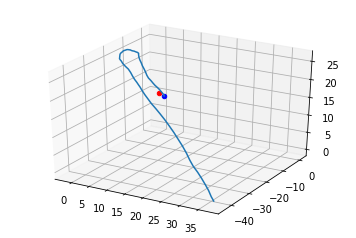

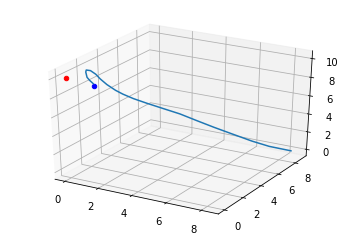

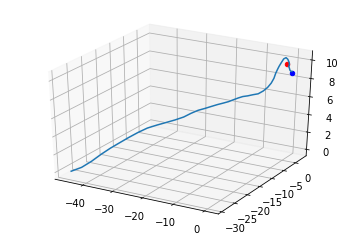

...

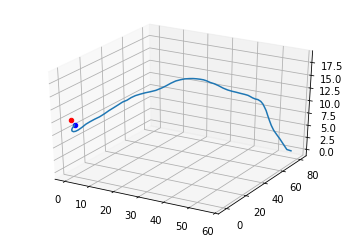

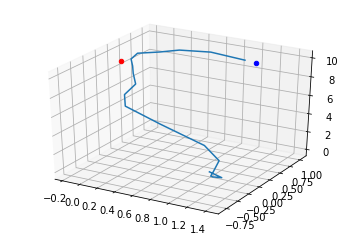

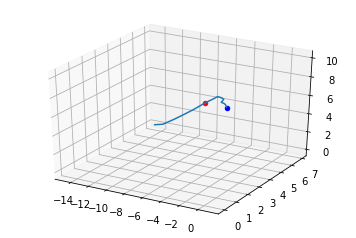

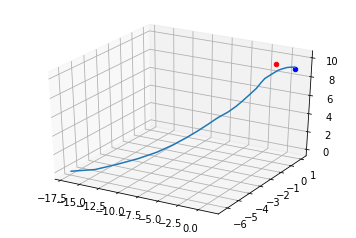

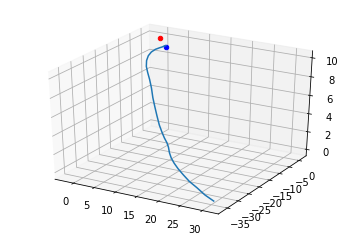

In [3]:
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

for epi_poss_ in epi_positions:
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter(*epi_init_pos, c='b', marker='o')
    ax.scatter(*target_pos, c='r', marker='o')
    x, y, z = zip(*epi_poss_)
    ax.plot(x, y, z)

    plt.show()


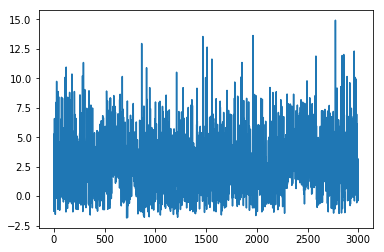

In [4]:
## TODO: Plot the rewards.
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt

reward_fig = plt.figure()
reward_ax = reward_fig.gca()
reward_ax.plot(*zip(*enumerate(rewards)))

plt.show()

In [5]:
np.average(rewards[-10:])

1.4766910451833408

## Reflections

**Question 1**: Describe the task that you specified in `task.py`.  How did you design the reward function?

**Answer**:

***States***

1. started with `self.sim.pose` as defined in `task.py`
2. Thought the actor should really know about the current velocity info in order to decide how "wrong" we are moving, so changed the state to `self.sim.pose + self.sim.v`
3. Thought even though the state object contains current position, velocity and reward, the actor won't be able to compare it to the target position, as we don't save that info. So, instead of using `self.sim.pose[:3]`, decided to use `[self.target_pos - self.sim.pose[:3] + self.sim.pose[3:] + self.sim.v` as state object
4. Also tried
```
reward += np.dot(self.sim.v, self.target_pos - self.current_pos) / (self.current_distance * np.linalg.norm(self.sim.v)) # reward on velocity's directional correctness
reward += (self.init_distance / (self.current_distance + self.init_distance)) - 1 # reward on closing the distance
reward += 0.25 if np.linalg.norm(self.last_pos - self.current_pos) > 0 else -0.25 # reward on moving
```
5. Gave up keeping track of all the attempts I've made ..
6. In the end, I've ended up with a state that contains:

  - current orientation
  - current velocity
  - linear accel
  - angular velocity
  - angular accel
  - current distance
  - direction towards the target position
  
  I've ended up ignoring the current position and used the current distance + direction toward the target position to generalize the reward for different target / current positions

*** Reward ***

Tried out quite a few things (as can be seen in the code, and the ones that are not left in the code)

In the end, I've ended up with the reward function that incentivizes as follows:
- abiding to the pre-defined linear, angular speed limit
- abiding to the pre-defined linear, angular acceleration limit
- stability of orientation: x and y axis rotation is +- pi / 4
- for each x, y, z:
  - current distance is within 5.0 (closer the better)
  - correct velocity direction
  - hovering behaviour when near the target position

**Question 2**: Discuss your agent briefly, using the following questions as a guide:

- What learning algorithm(s) did you try? What worked best for you?
- What was your final choice of hyperparameters (such as $\alpha$, $\gamma$, $\epsilon$, etc.)?
- What neural network architecture did you use (if any)? Specify layers, sizes, activation functions, etc.

**Answer**:
- ddpg actor-critic model
- Hyperparameters

  (from `agent.py`)
  
  ```
    # Noise process
    self.exploration_mu = 0.25
    self.exploration_theta = 0.2
    self.exploration_sigma = 0.2

    # Replay memory
    self.buffer_size = 1000000
    self.batch_size = 64
    self.memory = ReplayBuffer(self.buffer_size, self.batch_size)

    # Algorithm parameters
    self.gamma = 0.995  # discount factor
    self.tau = 0.1  # for soft update of target parameters

    self.critic_learning_rate = 0.001
    self.actor_learning_rate = 0.001
  ```
- architecture
  - experience replay
    - 1 * 10^6 buffer
    - batch size 64
  -  actor
    - 2 fully connected layers
      - 500 units, 400 units
      - batch normalization
      - `tanh` activation
    - adam optimizer
  - critic
    - 2 layer `net_states`
      - 500 units, 400 units
      - batch normalization
      - `tanh` activation
    - 1 layer `net_actiona`
      - 400 units
      - batch normalization
      - `tanh` activation
    - adam optimizaer
    

**Question 3**: Using the episode rewards plot, discuss how the agent learned over time.

- Was it an easy task to learn or hard?
- Was there a gradual learning curve, or an aha moment?
- How good was the final performance of the agent? (e.g. mean rewards over the last 10 episodes)

**Answer**:
- It was an hard task to learn. Reward still fluctuates greatly
- I think it was gradual overall, but some aha moments here and there, where the agent seems to change its general strategy
- Agent seems to have started to learn to minimize the y axis deviation, and to turn around in x and z axis when deviating too much from the target

**Question 4**: Briefly summarize your experience working on this project. You can use the following prompts for ideas.

- What was the hardest part of the project? (e.g. getting started, plotting, specifying the task, etc.)
- Did you find anything interesting in how the quadcopter or your agent behaved?

**Answer**:
- I think the hardest part of the project was tweaking hyperparameters and reward function. Especially because it takes time to get meaningful feedback before trying something else. Also, personally, I thought the project lacked descriptions and I had to read through env simuation code to figure out what is going on. It would have been much eaiser to get started if there were some description of what each of the member variables of simulation mean and how they are formed.
- It figured out to stay in-line in y coordinate,